This file contains time series analysis for the combined dog adoption data from Austin, TX and austin, CA. We use a combination of baseline models and other more advanced ones (see below) for daily/weekly/monthly data.

We intend to include models from extreme value analysis, inspired by "Modeling Extreme Events in Time Series and Their Impact on Seasonal Adjustment in the Post-Covid-19 Era", Anindya Roy,and Tucker S. McElroy.

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from seaborn import set_style

from datetime import datetime

set_style("whitegrid")

In [21]:
# read csv and change date columns into dtype = datetime64
df = pd.read_csv("../main_data/CleanedDataOnePlace.csv", parse_dates=["Date"])

/tmp/ipykernel_43995/1664856861.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv("../main_data/CleanedDataOnePlace.csv", parse_dates=["Date"])


In [22]:
df.head()

,Date,SonomaIntakeTotals,SonomaOutcomeTotals,SonomaDifferences,SonomaRatio,Sonoma_intake_stray_abandoned,Sonoma_intake_owner_surrender,Sonoma_intake_euthanasia,Sonoma_intake_public_assist,Sonoma_intake_other_i,...,Austin_Owner_Surrender,Austin_Other,Austin_Adopt,Austin_Euth,Austin_RTO,Austin_Unintended,Austin_Other.1,Inflation Rate,Unemployment Rate,Covid
0,2013-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.0,0.0,6.0,7.0,11.0,0.0,5.0,1.0,7.2,0.0
1,2013-10-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.0,0.0,12.0,2.0,9.0,0.0,10.0,1.0,7.2,0.0
2,2013-10-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,0.0,7.0,0.0,6.0,0.0,5.0,1.0,7.2,0.0
3,2013-10-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.0,0.0,6.0,3.0,9.0,0.0,5.0,1.0,7.2,0.0
4,2013-10-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.0,0.0,22.0,2.0,6.0,0.0,8.0,1.0,7.2,0.0


In [23]:
# Choose dates where both data agree
df = df.loc[(df["Date"] >= pd.Timestamp(year = 2014, month = 1, day =1)) & (df["Date"] <= pd.Timestamp(year = 2024, month = 5, day =1))]

# df = df[df["SonomaRatio"].notna() & df["AustinRatio"].notna()]

# This column contains nans and np.inf, since there are no outcomes data on certain days. fill with 0
df = df.fillna(value={"AustinOutcomeTotal":0})

# Recompute ratios for Sonoma and Austin
df["SonomaRatio"] = df["SonomaIntakeTotals"] / df["SonomaOutcomeTotals"]
df["AustinRatio"] = df["AustinIntakeTotal"] / df["AustinOutcomeTotal"]
df["SonomaLogRatio"] = np.log(df["SonomaRatio"])
df["AustinLogRatio"] = np.log(df["AustinRatio"])

# There are some divisions by 0, replace by nan and remove such rows
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df = df[df["SonomaRatio"].notna() & df["AustinRatio"].notna() & df["SonomaLogRatio"].notna() & df["AustinLogRatio"].notna()].reset_index(drop=True)

/home/jun/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/jun/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [24]:
col_list = ["SonomaIntakeTotals", "SonomaOutcomeTotals","SonomaDifferences","SonomaRatio", "SonomaLogRatio","AustinIntakeTotal","AustinOutcomeTotal","AustinDifferences","AustinRatio", "AustinLogRatio"]

In [25]:
daily_maxmindiff = (df[col_list].max(axis=0) - df[col_list].min(axis=0))

## (0) Goal:
- TSA for intakes, outcomes, intakes - outcomes, intakes/outcomes
    - Sonoma
    - Austin
    - Combined?
- baseline models
    - naive (use last value)
    - average
    - trend
    - random walk
    - random walk with drift
    - seasonal???
- other models
- EVA models
- compare with features:
    - CPI
    - unemployment
    - stock prices
    - intake subtypes?
    - etc.

Let's begin with some data visualisation of the two regions.

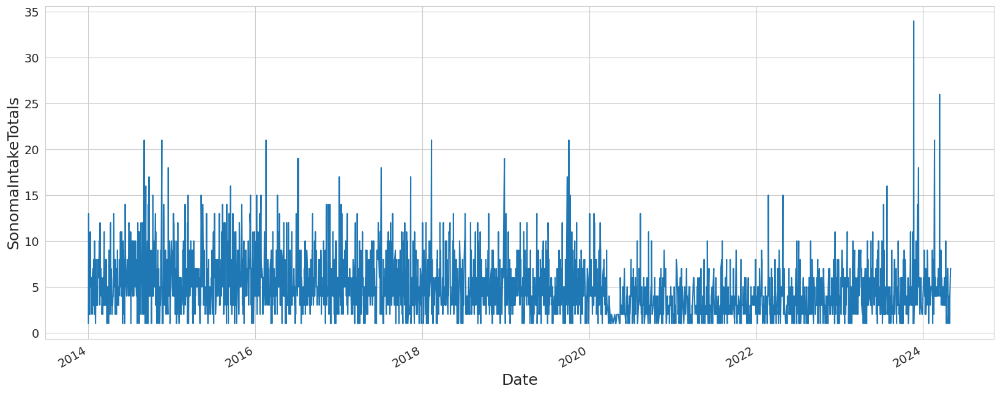

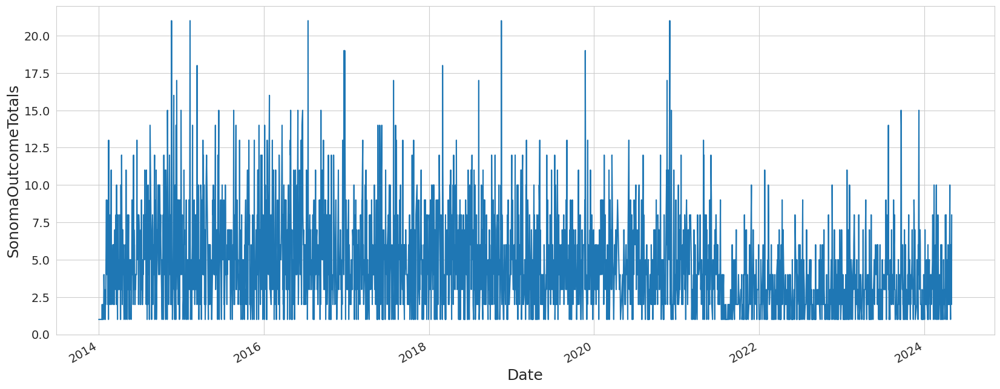

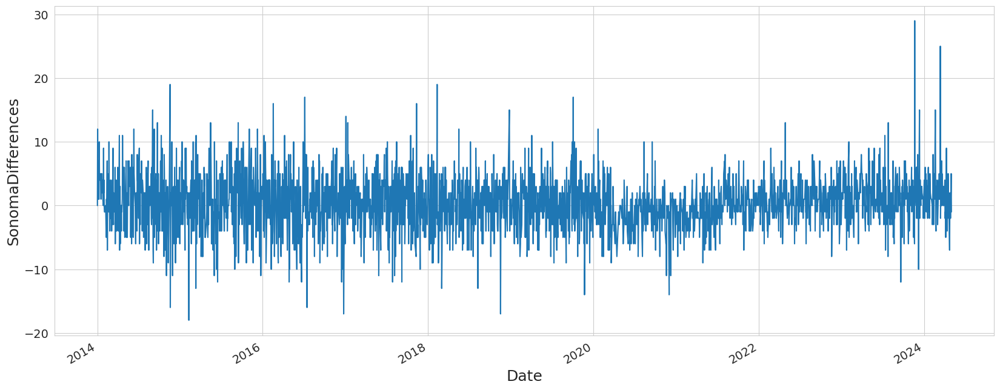

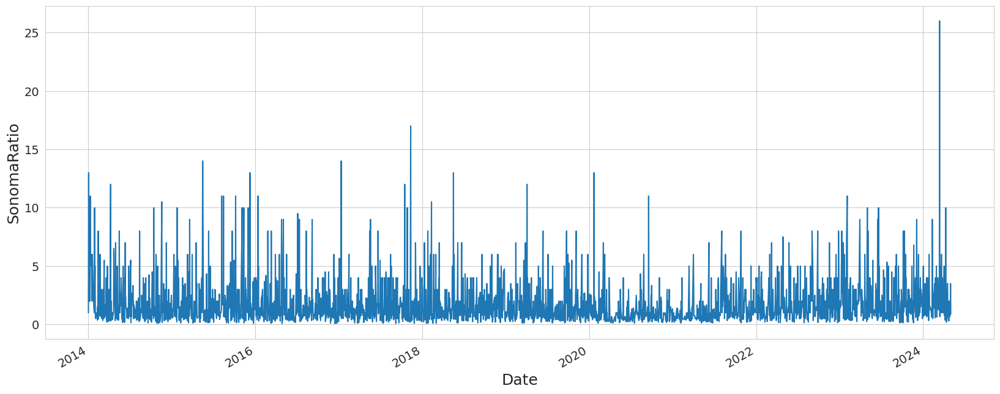

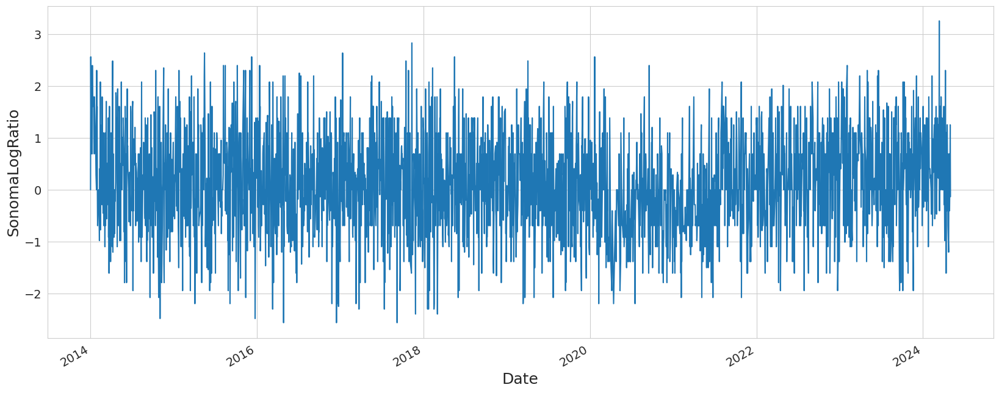

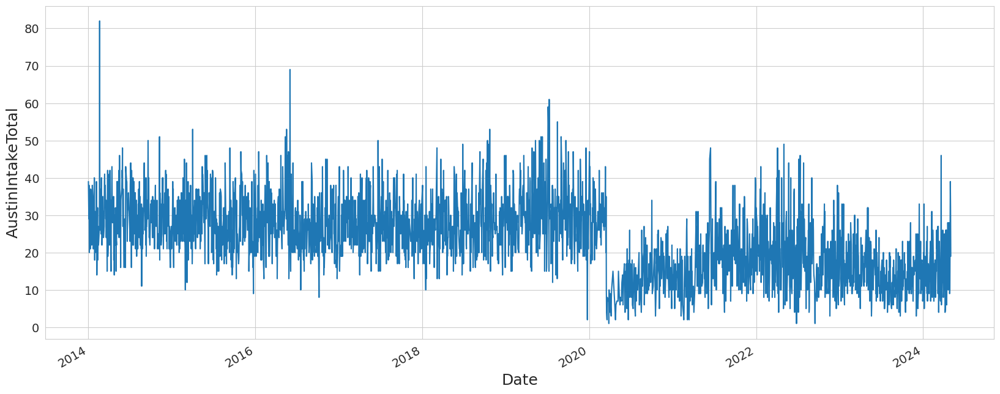

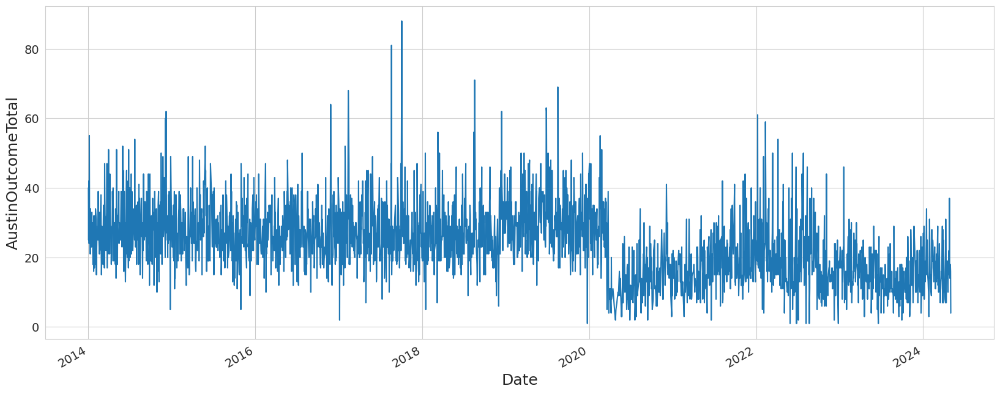

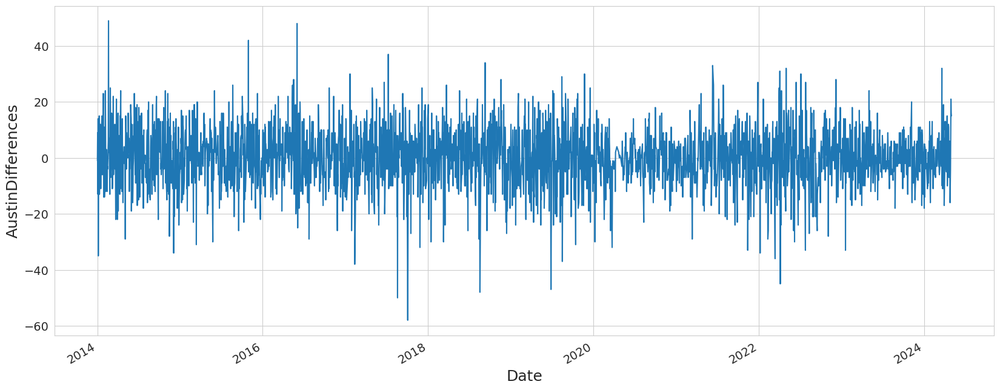

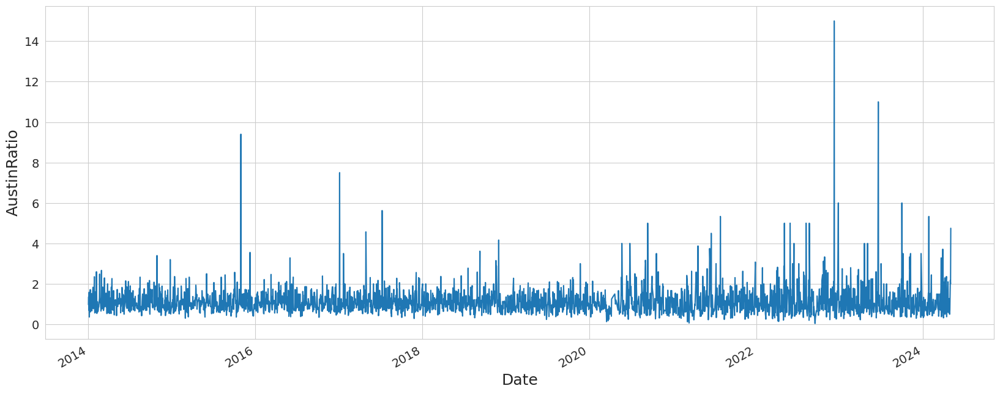

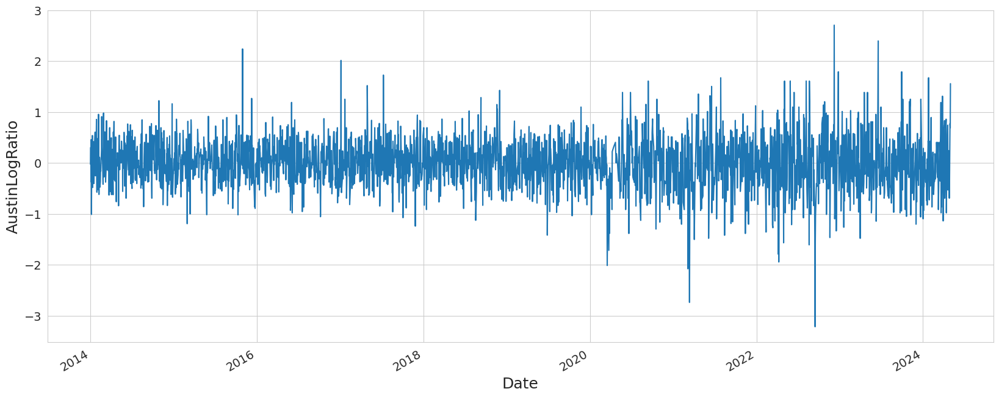

In [26]:
for col in col_list:
    plt.figure(figsize=(20,8))
    plt.plot(df["Date"], df[col])

    plt.xlabel("Date", fontsize=18)
    plt.ylabel(col, fontsize=18)

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.gcf().autofmt_xdate()

    plt.show()

Sonoma data is "noisier" than Austin's, most likely due to size of data in both regions. One could observe that there is a significant change when COVID-19 (March 16 2020) measures were in place.

In [27]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

In [28]:
# k = 100
# test size = 14 days
kfold = TimeSeriesSplit(n_splits = 100,
                           test_size = 14)

In [29]:
df_train = df.iloc[:-14].copy()
df_test = df.drop(df_train.index).copy()

## (1) Baseline models
1. Average : y_t = ybar for t >= n
2. Naive : y_t = y_n for t >= n
3. Linear : y_t = beta_0 + beta_1 * t for t >= n
4. (Gaussian) random walk with drift: y_t = y_n + beta_1* (t-n) where beta_1 = 1/n (y_n - y_0)

In [30]:
avg_rmses= np.zeros((10,100))
naive_rmses= np.zeros((10,100))
slr_rmses= np.zeros((10,100))
rw_drift_rmses= np.zeros((10,100))

i = 0
for train_index, test_index in kfold.split(df_train):
    df_tt = df_train.iloc[train_index]
    df_ho = df_train.iloc[test_index]
    for j in range(len(col_list)):
        
        # 1. Average forecast
        # forecast using average of training set
        df_tt_avg = df_tt[col_list[j]].mean()
        avg_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, df_tt_avg*np.ones(len(df_ho))))
        
        # 2. Naive forecast
        # forecast using last value of training set
        df_tt_naive = df_tt[col_list[j]].values[-1]
        naive_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, df_tt_naive*np.ones(len(df_ho))))
        
        
        # 3. Linear trend forecast
        # coefficients estimated through linear regression on training set
        slr = LinearRegression()
        slr.fit(np.array(df_tt.index).reshape(-1,1),
                df_tt[col_list[j]])
        pred = slr.predict(np.array(df_ho.index).reshape(-1,1))
        slr_rmses[j,i] = np.sqrt(mean_squared_error( df_ho[col_list[j]], pred))
        
        # 4. (Gaussian) random walk with drift
        beta_hat = (df_tt[col_list[j]].values[-1] - df_tt[col_list[j]].values[0])/len(df_tt)
        drift_pred = df_tt[col_list[j]].values[-1] + beta_hat*np.arange(1,len(df_ho) + 1)
        rw_drift_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]], drift_pred))
                
    i += 1
    
print(" Average: \n", avg_rmses.mean(axis=1))
print(" Naive: \n",naive_rmses.mean(axis=1))
print(" Linear: \n",slr_rmses.mean(axis=1))
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1))

 Average: 
 [ 2.89664137  2.82466534  3.65008514  1.63566577  0.91355567 11.12746148
 11.17912055  9.77219194  0.68489104  0.53861994]
 Naive: 
 [ 3.48097797  3.39265103  5.06555599  2.17975223  1.24767584 10.0341243
 10.73562274 13.74536639  0.94606191  0.75043555]
 Linear: 
 [2.67302703 2.59986129 3.66572935 1.6172581  0.91563982 9.06072149
 9.34660525 9.7716717  0.68562657 0.53856764]
 Random walk with drift: 
 [ 3.48564836  3.39853638  5.07451273  2.18273959  1.2497529  10.05118442
 10.75701656 13.76829292  0.94744639  0.75161672]


## (2) Spicy stuff

- first decide on stationarity, autocorrelation
- (M)oving (A)verage model ?
- (A)uto (R)egressive model ?
- (S)ARIMA ?

In [31]:
import statsmodels.api as sm

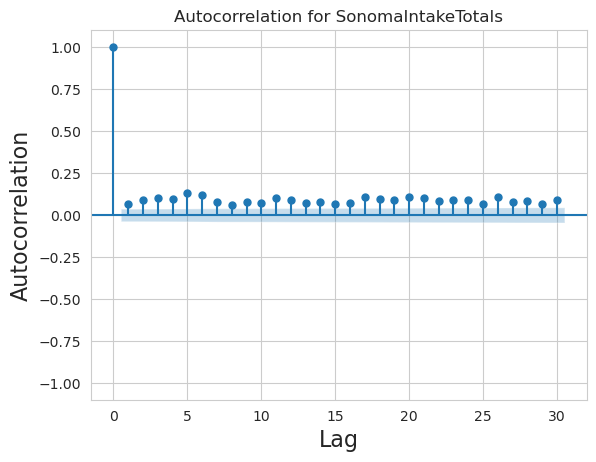

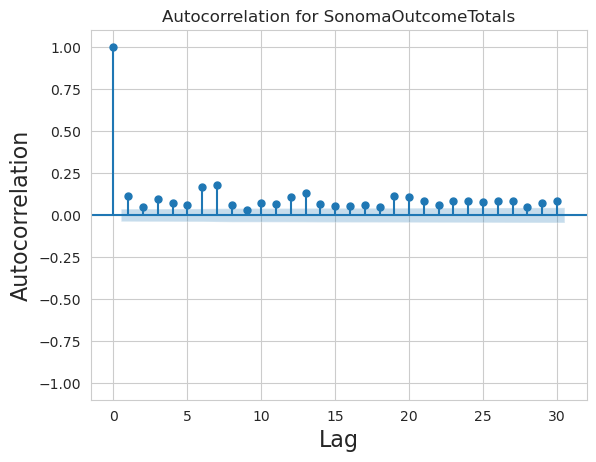

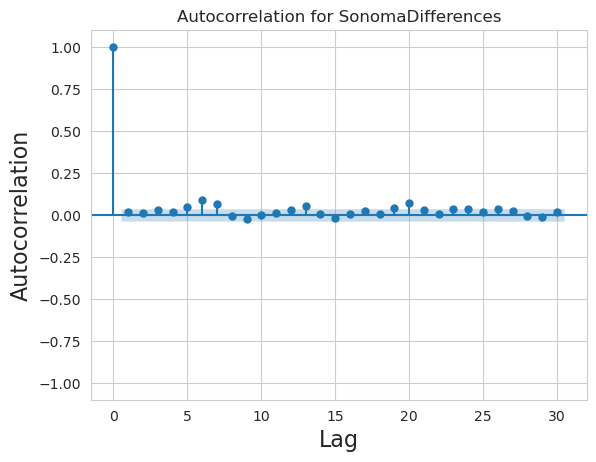

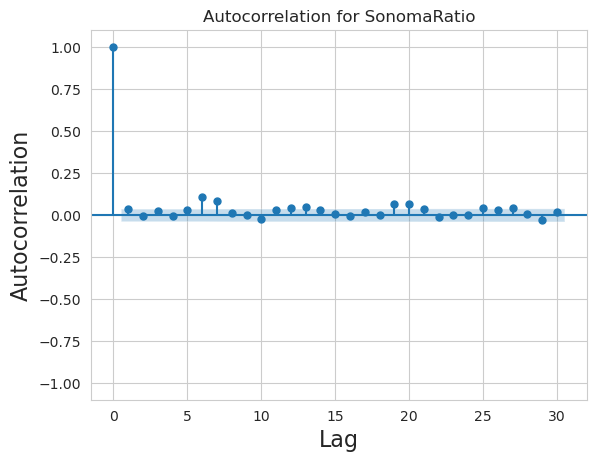

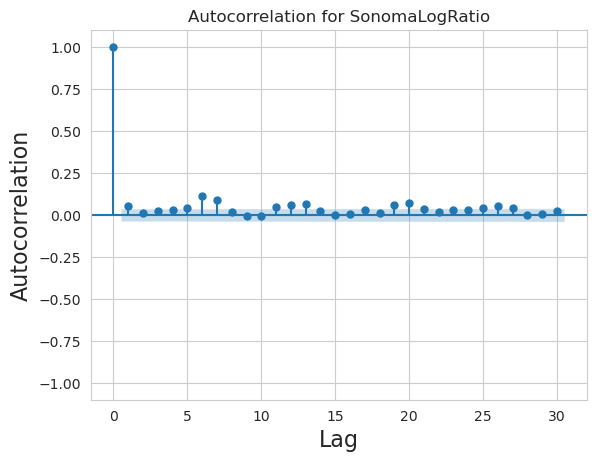

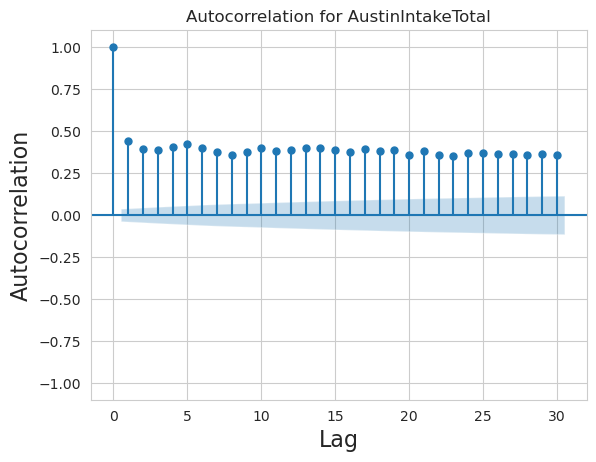

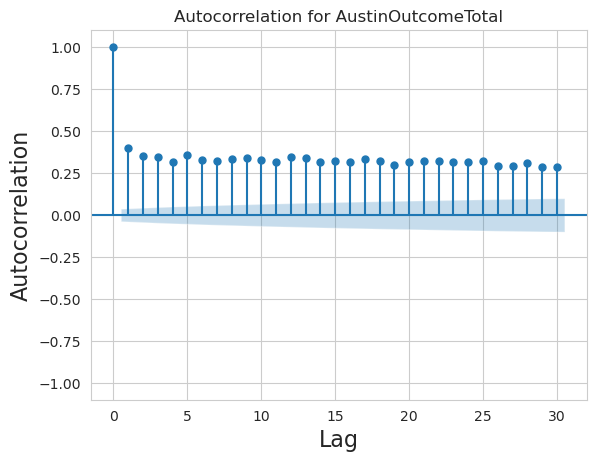

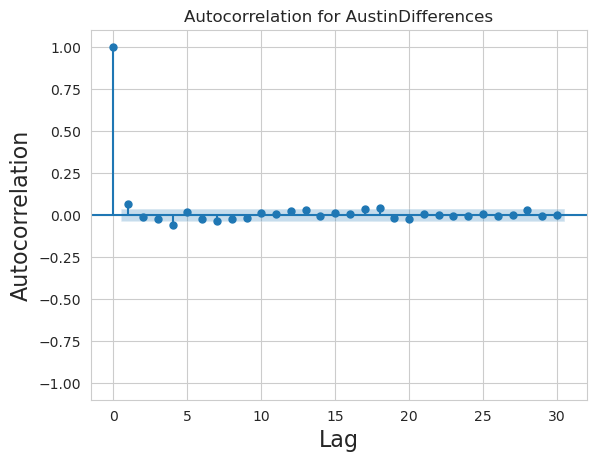

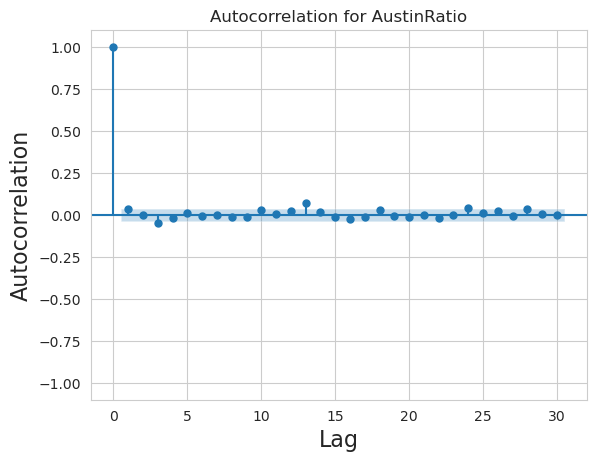

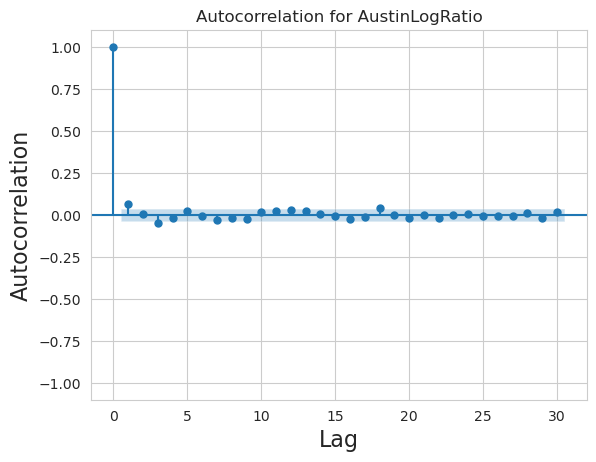

In [32]:
# Autocorrelation plots for starionarity and autocorrelation
for col in col_list:
    sm.graphics.tsa.plot_acf(df_train[col],
                                lags = 30)

    plt.title('Autocorrelation for ' + col, fontsize=12)
    plt.ylabel("Autocorrelation", fontsize=16)
    plt.xlabel("Lag", fontsize=16)

    plt.ylim(-1.1,1.1)

    plt.show()

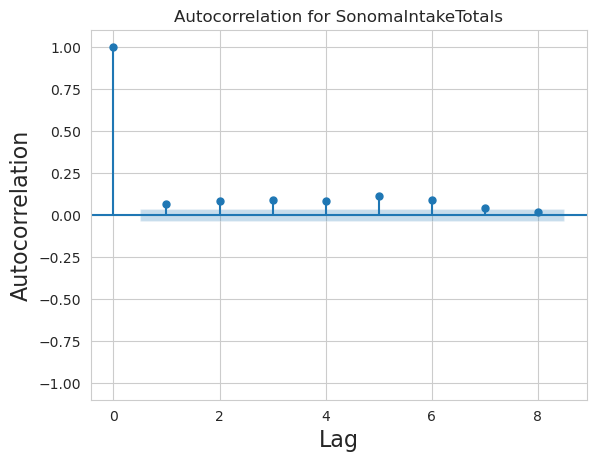

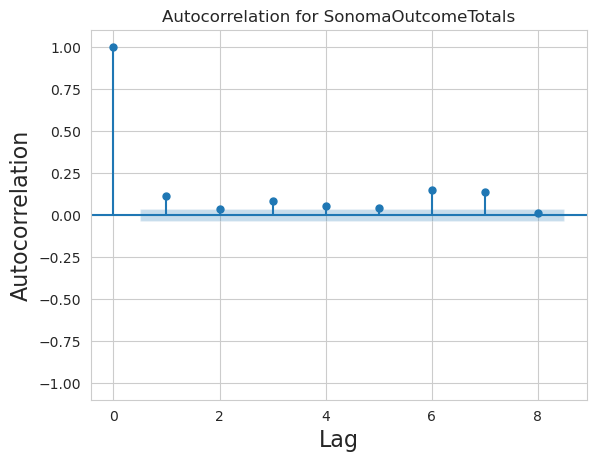

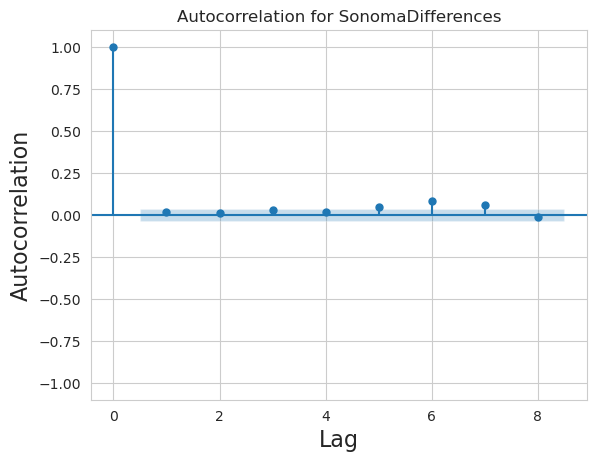

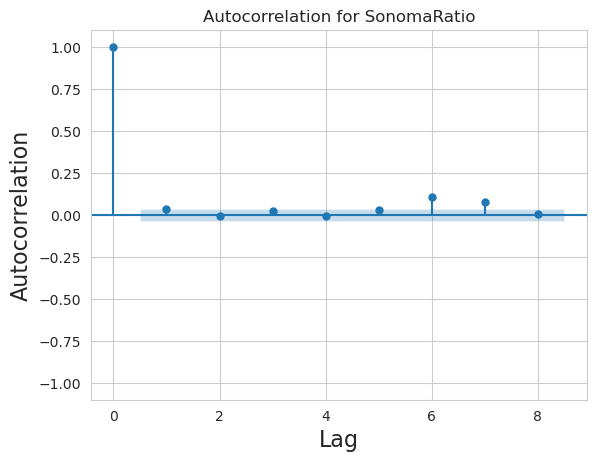

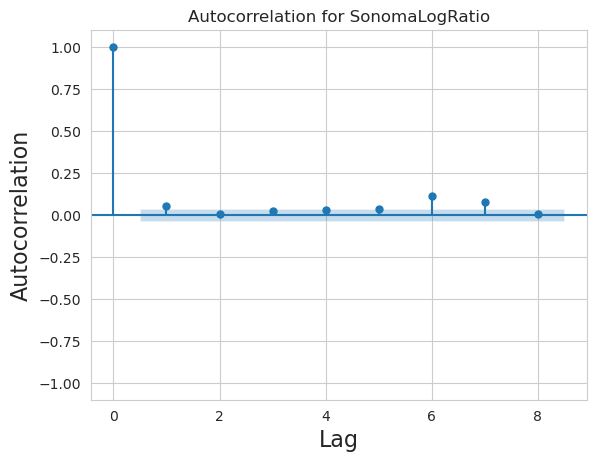

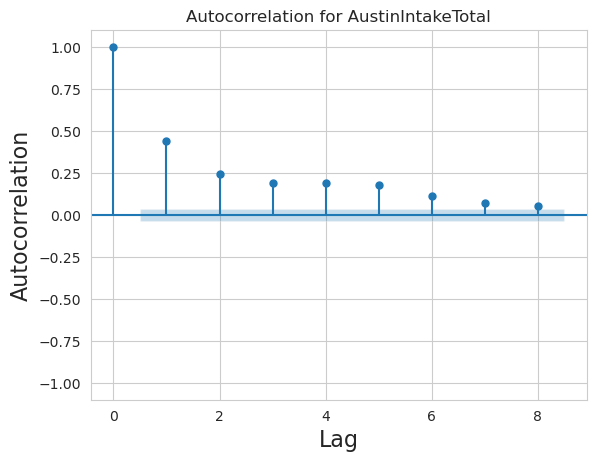

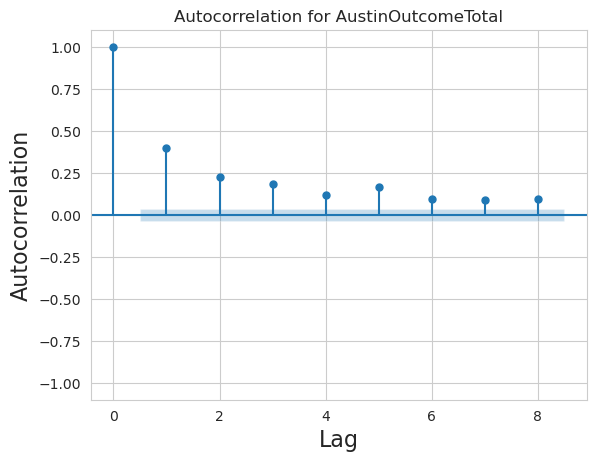

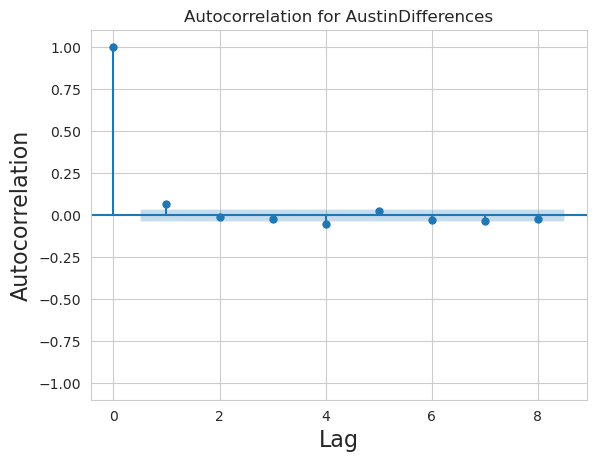

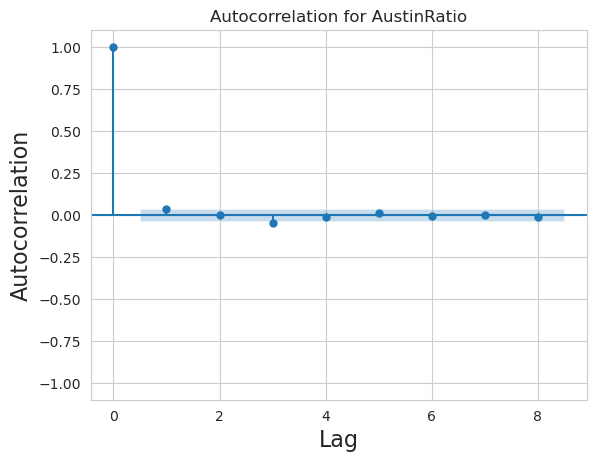

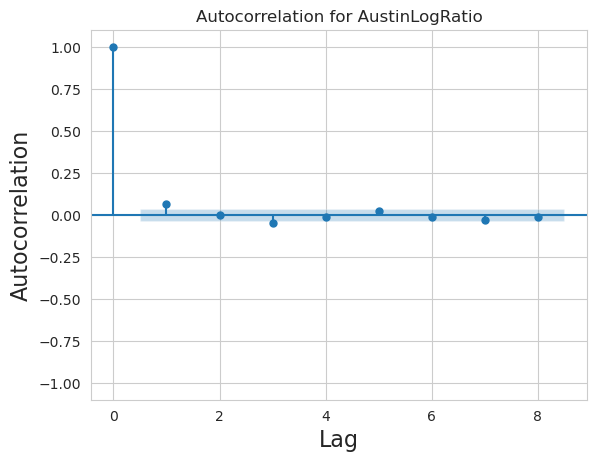

In [33]:
# Autocorrelation plots for starionarity and autocorrelation
for col in col_list:
    sm.graphics.tsa.plot_pacf(df_train[col],
                                lags = 8)

    plt.title('Autocorrelation for ' + col, fontsize=12)
    plt.ylabel("Autocorrelation", fontsize=16)
    plt.xlabel("Lag", fontsize=16)

    plt.ylim(-1.1,1.1)

    plt.show()

### Observations:

Sonoma:
- Differences and LogRatio appear to be random
- All are stationary - declined to nonsignificant levels very quickly
- no seasonality (up to 35 days)

Austin:
- Differences and LogRatio (and Ratio) appear to be random
- The rest seem to be nonstationary - slow decline of autocorrelations
- no seasonality (up to 35 days)


In [76]:
# One could also try seasonal_decompose to find seasonality/trend and adfuller to find stationarity
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller


In [77]:
# for col in col_list:
#     try:
#         result_mul = seasonal_decompose(df_train[col], model='multiplicative',period=1)
#         result_add = seasonal_decompose(df_train[col], model='multiplicative',period=1)
#         result_mul.plot().suptitle("Mult decompose")
#         result_add.plot().suptitle("Add decompose")
#         plt.show()
#     except:
#         continue

In [78]:
# null hypothesis: time series possesses a unit root and is non-stationary
# i.e., if p-value > 0.05, accept null hypothesis
# output below implies that all are stationary (contrary to the above observation, decline of Austin intake/outcomes are fast enough)
for col in col_list:
    result = adfuller(df_train[col], autolag='AIC')
    print(col)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    for key, value in result[4].items():
        print('Critial Values:')
        print(f'   {key}, {value}')


SonomaIntakeTotals
ADF Statistic: -5.432426334088088
p-value: 2.8945837958077035e-06
Critial Values:
   1%, -3.4327318846293067
Critial Values:
   5%, -2.8625923457274998
Critial Values:
   10%, -2.567330197306391
SonomaOutcomeTotals
ADF Statistic: -6.330257651759565
p-value: 2.9181438672930724e-08
Critial Values:
   1%, -3.432730150728559
Critial Values:
   5%, -2.8625915799748762
Critial Values:
   10%, -2.567329789619835
SonomaDifferences
ADF Statistic: -9.299279187248874
p-value: 1.1238869601939365e-15
Critial Values:
   1%, -3.4327275546055227
Critial Values:
   5%, -2.8625904334332013
Critial Values:
   10%, -2.567329179201397
SonomaRatio
ADF Statistic: -9.383539689158848
p-value: 6.855010719607905e-16
Critial Values:
   1%, -3.4327275546055227
Critial Values:
   5%, -2.8625904334332013
Critial Values:
   10%, -2.567329179201397
SonomaLogRatio
ADF Statistic: -8.975345774374084
p-value: 7.558434819268703e-15
Critial Values:
   1%, -3.4327275546055227
Critial Values:
   5%, -2.8625

In [18]:
# No seasonality observed, use auto_arima to find the optimal hyperparameters
from pmdarima import auto_arima
import statsmodels.tsa.api as sm

In [19]:
for i in range(len(col_list)):
    print(col_list[i])
    auto_arima(df_train[col_list[i]], trace=True)

SonomaIntakeTotals
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=14028.065, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=15969.083, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=15130.314, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=14024.343, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=15967.083, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=14024.600, Time=0.64 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=14024.595, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=14028.287, Time=0.72 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=14022.358, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=14022.612, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=14022.606, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=15128.314, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=14024.605, Time=0.58 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 4.89

In [18]:
# ARIMA hyperparameters from the above cell
sonoma_intake_arima_model = sm.ARIMA(df_train["SonomaIntakeTotals"], order = (0,1,1)).fit()
sonoma_outcome_arima_model = sm.ARIMA(df_train["SonomaOutcomeTotals"], order = (0,1,3)).fit()
sonoma_diff_arima_model = sm.ARIMA(df_train["SonomaDifferences"], order = (0,1,1)).fit()
sonoma_ratio_arima_model = sm.ARIMA(df_train["SonomaRatio"], order = (0,1,1)).fit()
sonoma_logratio_arima_model = sm.ARIMA(df_train["SonomaLogRatio"], order = (0,1,1)).fit()
austin_intake_arima_model = sm.ARIMA(df_train["AustinIntakeTotal"], order = (0,1,2)).fit()
austin_outcome_arima_model = sm.ARIMA(df_train["AustinOutcomeTotal"], order = (1,1,1)).fit()
austin_diff_arima_model = sm.ARIMA(df_train["AustinDifferences"], order = (2,0,1)).fit()
austin_ratio_arima_model = sm.ARIMA(df_train["AustinRatio"], order = (5,1,0)).fit()
austin_logratio_arima_model = sm.ARIMA(df_train["AustinLogRatio"], order = (2,0,2)).fit()

arima_models = [sonoma_intake_arima_model,
                sonoma_outcome_arima_model,
                sonoma_diff_arima_model,
                sonoma_ratio_arima_model,
                sonoma_logratio_arima_model,
                austin_intake_arima_model,
                austin_outcome_arima_model,
                austin_diff_arima_model,
                austin_ratio_arima_model,
                austin_logratio_arima_model]

/home/jun/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/jun/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [55]:
# Record ARIMA rmse's
arima_rmses= np.zeros((10,100))

i = 0
for train_index, test_index in kfold.split(df_train):
    df_tt = df_train.iloc[train_index]
    df_ho = df_train.iloc[test_index]
    for j in range(len(col_list)):
        
        # ARIMA forecast
        arima_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, arima_models[j].forecast(len(df_ho))))
                
    i += 1

RMSE's of all models used:

In [56]:
print(" Average: \n", avg_rmses.mean(axis=1))
print(" Naive: \n",naive_rmses.mean(axis=1))
print(" Linear: \n",slr_rmses.mean(axis=1))
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1))
print(" ARIMA: \n", arima_rmses.mean(axis=1))

 Average: 
 [ 2.89664137  2.82466534  3.65008514  1.63566577  0.91355567 11.12746148
 11.17912055  9.77219194  0.68489104  0.53861994]
 Naive: 
 [ 3.48097797  3.39265103  5.06555599  2.17975223  1.24767584 10.0341243
 10.73562274 13.74536639  0.94606191  0.75043555]
 Linear: 
 [2.67302703 2.59986129 3.66572935 1.6172581  0.91563982 9.06072149
 9.34660525 9.7716717  0.68562657 0.53856764]
 Random walk with drift: 
 [ 3.48564836  3.39853638  5.07451273  2.18273959  1.2497529  10.05118442
 10.75701656 13.76829292  0.94744639  0.75161672]
 ARIMA: 
 [ 2.84978515  2.62138109  3.80050785  1.66093022  0.95893765  9.95888447
 10.12305735  9.76989839  0.68601973  0.53824961]


NRMSE's of all models used (NRMSE = RMSE/max - min):

In [57]:
print(" Average: \n", avg_rmses.mean(axis=1)/daily_maxmindiff)
print(" Naive: \n",naive_rmses.mean(axis=1)/daily_maxmindiff)
print(" Linear: \n",slr_rmses.mean(axis=1)/daily_maxmindiff)
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1)/daily_maxmindiff)
print(" ARIMA: \n", arima_rmses.mean(axis=1)/daily_maxmindiff)

 Average: 
 SonomaIntakeTotals     0.087777
SonomaOutcomeTotals    0.141233
SonomaDifferences      0.077661
SonomaRatio            0.063097
SonomaLogRatio         0.156886
AustinIntakeTotal      0.137376
AustinOutcomeTotal     0.128496
AustinDifferences      0.091329
AustinRatio            0.045781
AustinLogRatio         0.090877
dtype: float64
 Naive: 
 SonomaIntakeTotals     0.105484
SonomaOutcomeTotals    0.169633
SonomaDifferences      0.107778
SonomaRatio            0.084085
SonomaLogRatio         0.214265
AustinIntakeTotal      0.123878
AustinOutcomeTotal     0.123398
AustinDifferences      0.128461
AustinRatio            0.063239
AustinLogRatio         0.126615
dtype: float64
 Linear: 
 SonomaIntakeTotals     0.081001
SonomaOutcomeTotals    0.129993
SonomaDifferences      0.077994
SonomaRatio            0.062387
SonomaLogRatio         0.157244
AustinIntakeTotal      0.111861
AustinOutcomeTotal     0.107432
AustinDifferences      0.091324
AustinRatio            0.045831
AustinLog

No significant difference in performance

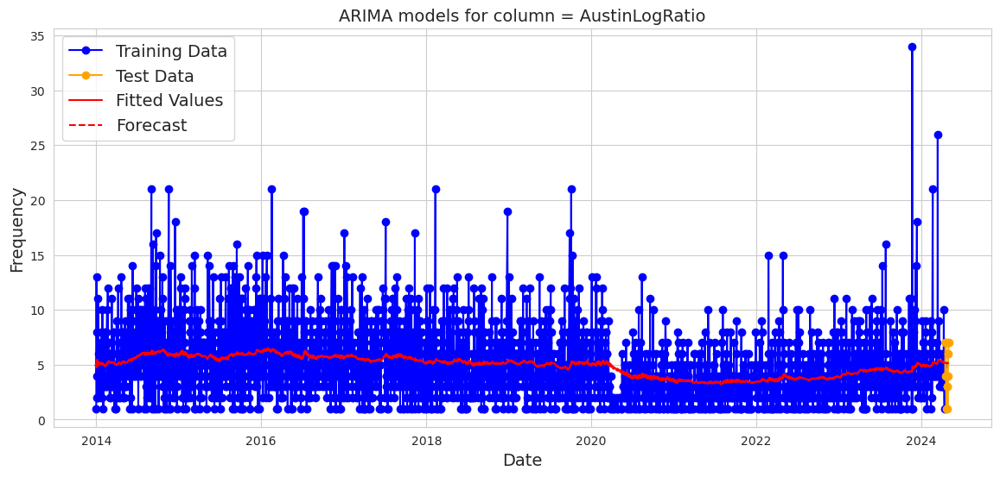

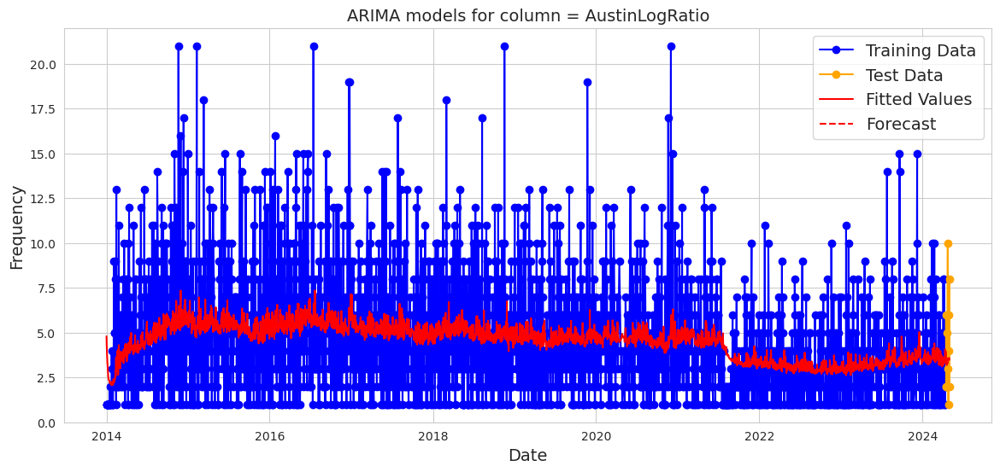

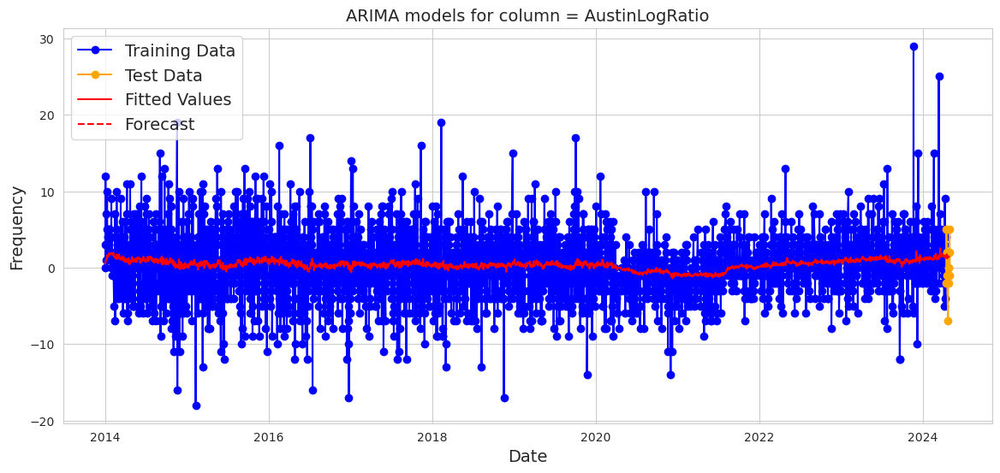

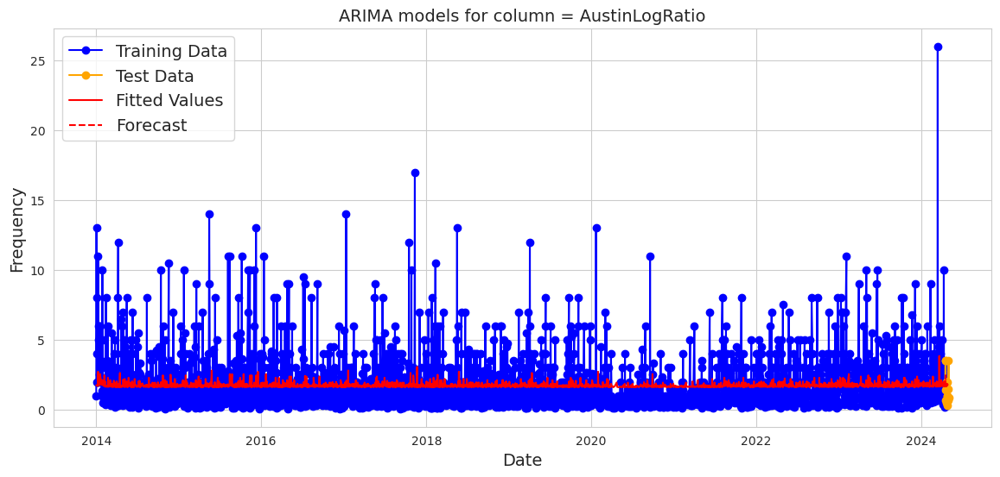

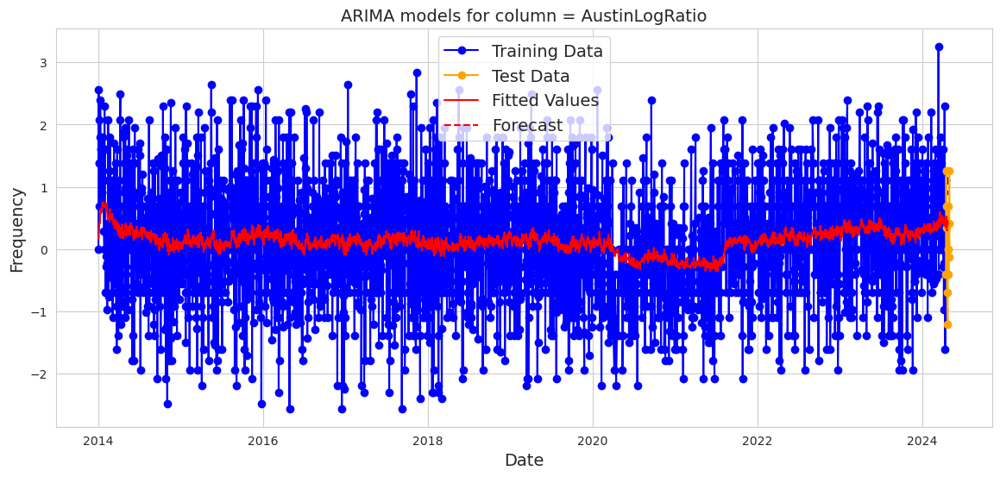

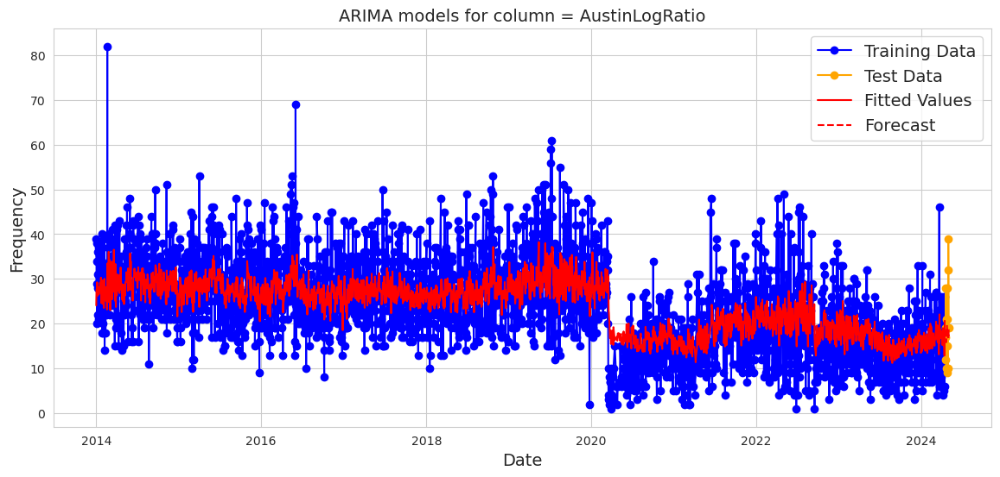

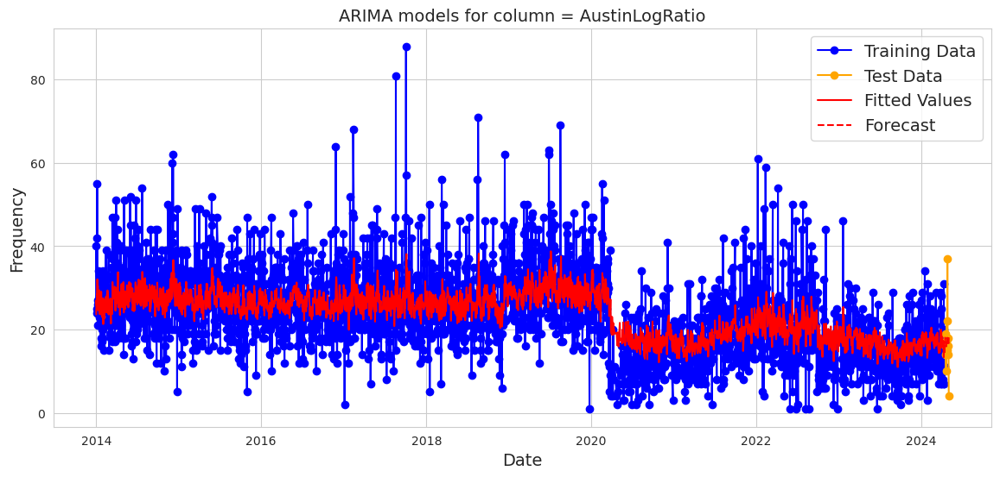

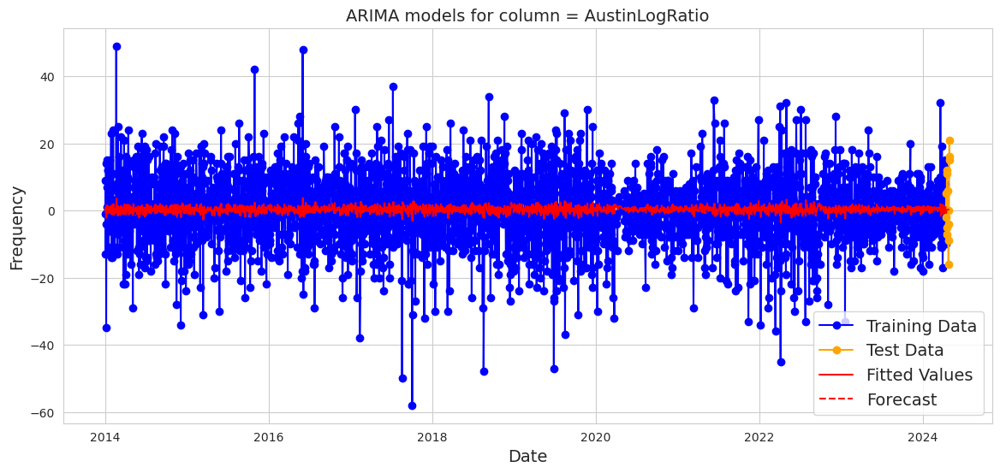

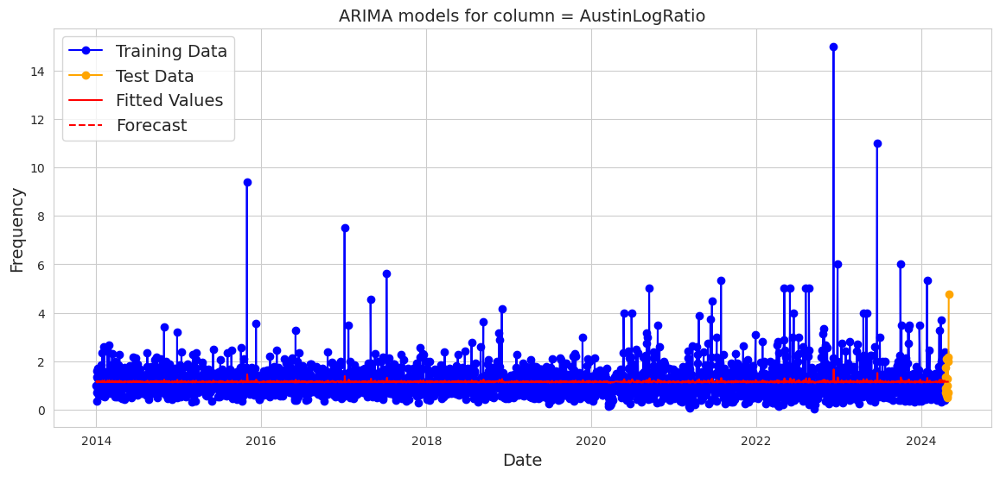

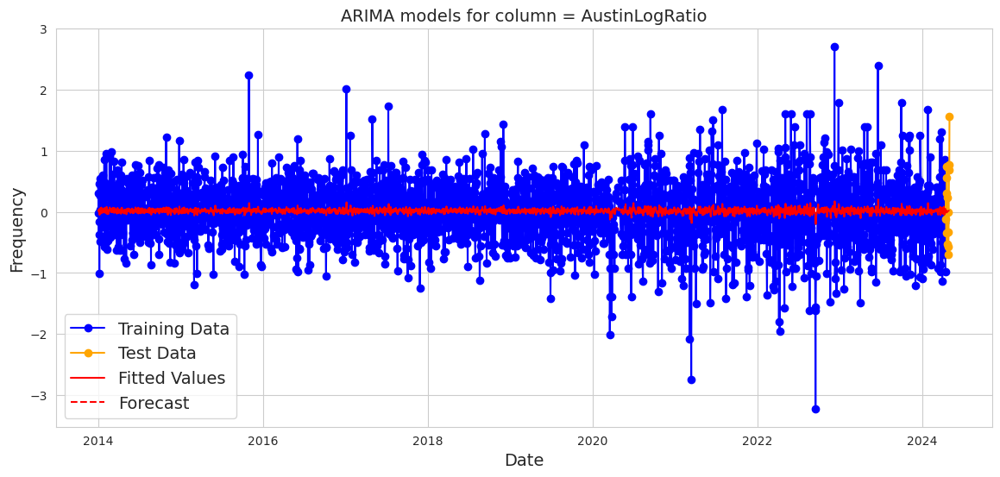

In [58]:
for i in range(len(col_list)):
    plt.figure(figsize=(14,6))

    plt.plot(df_train["Date"],
                df_train[col_list[i]],
                'b-o',
                label='Training Data')

    plt.plot(df_test["Date"],
                df_test[col_list[i]],
                color = 'orange',
                marker = 'o',
                label='Test Data')

    plt.plot(df_train["Date"],
                arima_models[i].fittedvalues,
                'r',
                label='Fitted Values')

    plt.plot(df_test["Date"],
                arima_models[i].forecast(len(df_test)),
                '--r',
                label="Forecast")

    plt.title("ARIMA models for column = " + col, fontsize=14)
    plt.legend(fontsize=14)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)

    plt.show()

### Do the above for weekly

In [80]:
# Redo everything just in case

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from seaborn import set_style

from datetime import datetime

set_style("whitegrid")

In [81]:
# Create df with year-week

df = pd.read_csv("../main_data/CleanedDataOnePlace.csv", parse_dates=["Date"])
df = df.loc[(df["Date"] >= pd.Timestamp(year = 2014, month = 1,day=1) ) & (df["Date"] <= pd.Timestamp(year = 2024, month = 5,day=1) )]
df['Date'] = df['Date'].dt.strftime('%Y-%U')

df = (df.groupby(df['Date'])[["SonomaIntakeTotals","SonomaOutcomeTotals","AustinIntakeTotal","AustinOutcomeTotal"]].sum().reset_index())

/tmp/ipykernel_43995/1388915859.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv("../main_data/CleanedDataOnePlace.csv", parse_dates=["Date"])


In [82]:
# Create extra columns
df["SonomaDifferences"] = df["SonomaIntakeTotals"] - df["SonomaOutcomeTotals"]
df["AustinDifferences"] = df["AustinIntakeTotal"] - df["AustinOutcomeTotal"]
df["SonomaRatio"] = df["SonomaIntakeTotals"] / df["SonomaOutcomeTotals"]
df["AustinRatio"] = df["AustinIntakeTotal"] / df["AustinOutcomeTotal"]
df["SonomaLogRatio"] = np.log(df["SonomaRatio"])
df["AustinLogRatio"] = np.log(df["AustinRatio"])

# There are some divisions by 0, replace by nan and remove such rows
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df = df[df["SonomaRatio"].notna() & df["AustinRatio"].notna() & df["SonomaRatio"]].reset_index(drop=True)

df = df[1:-1]

In [83]:
col_list = ["SonomaIntakeTotals", "SonomaOutcomeTotals","SonomaDifferences","SonomaRatio", "SonomaLogRatio","AustinIntakeTotal","AustinOutcomeTotal","AustinDifferences","AustinRatio", "AustinLogRatio"]

In [84]:
weekly_maxmindiff = (df[col_list].max(axis=0) - df[col_list].min(axis=0))

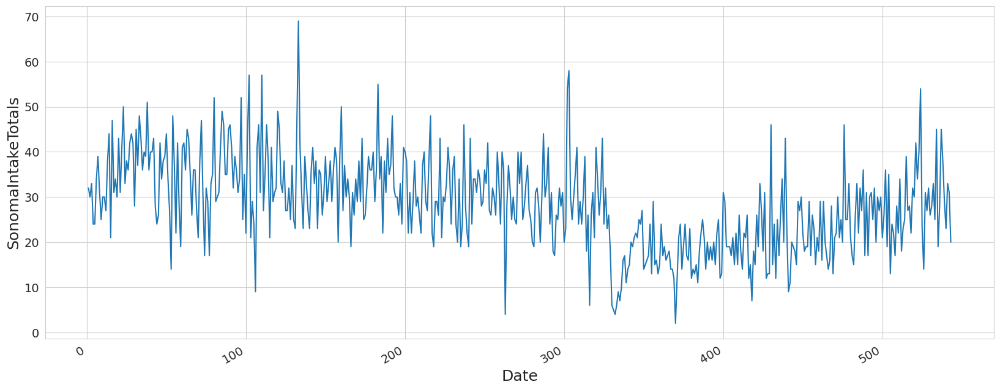

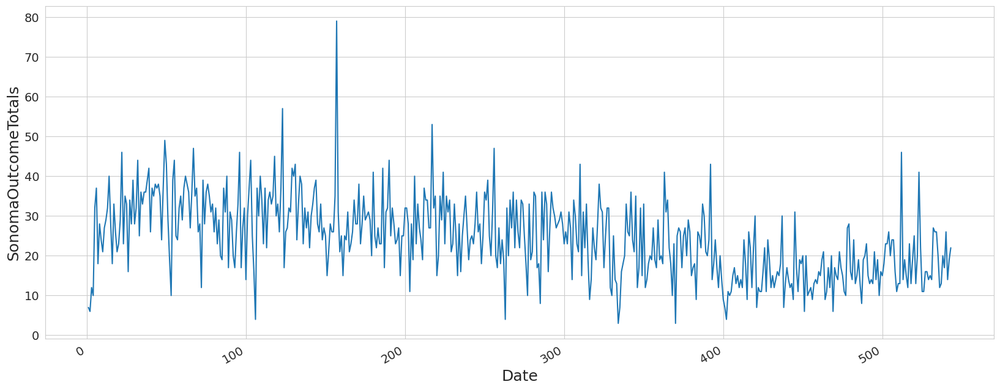

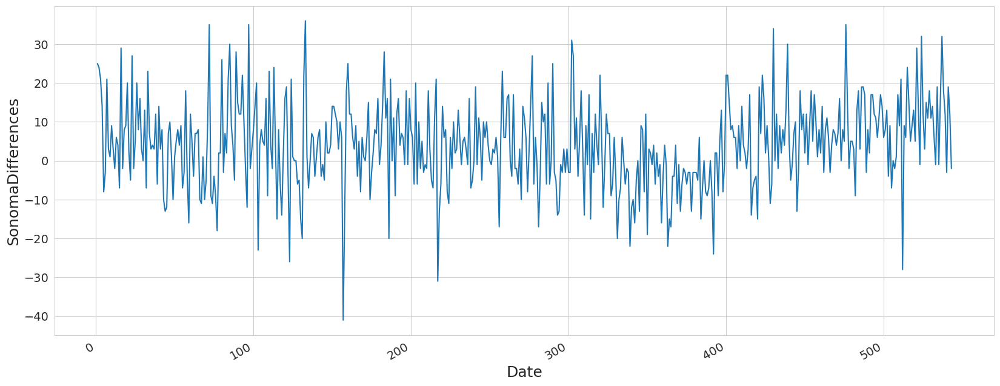

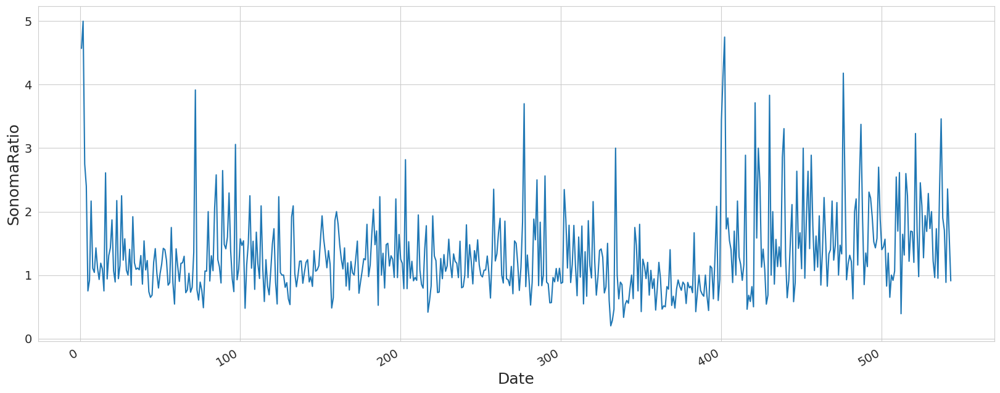

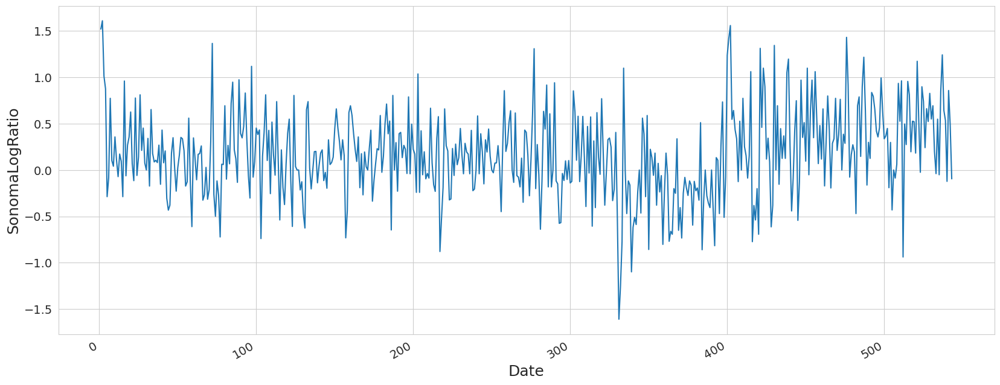

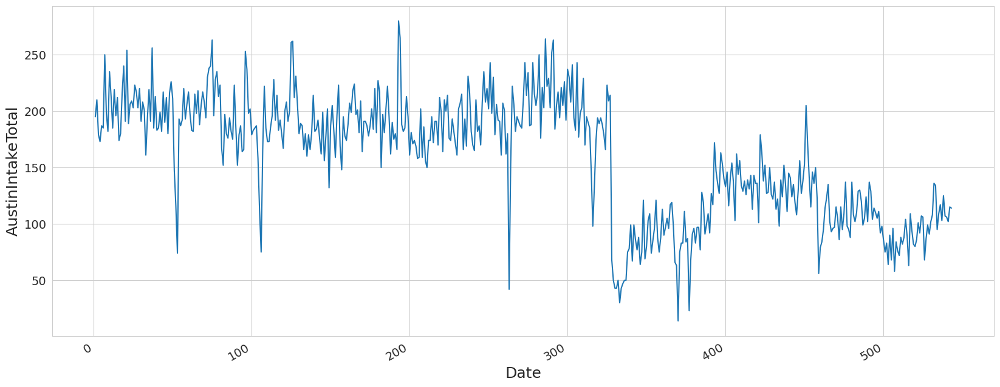

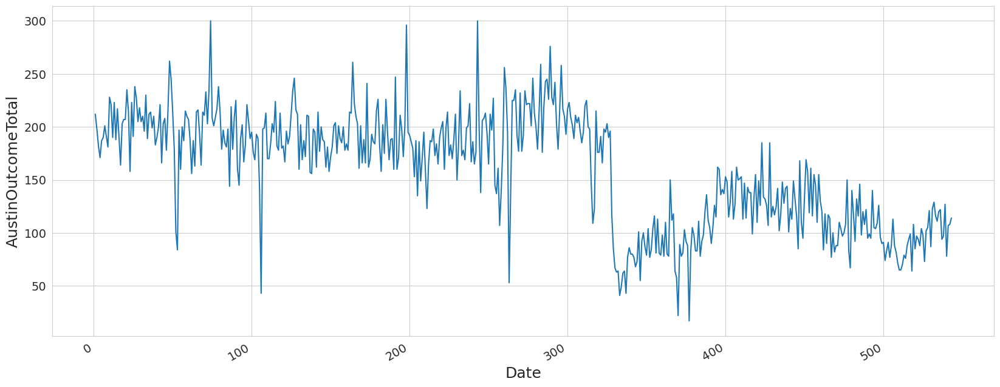

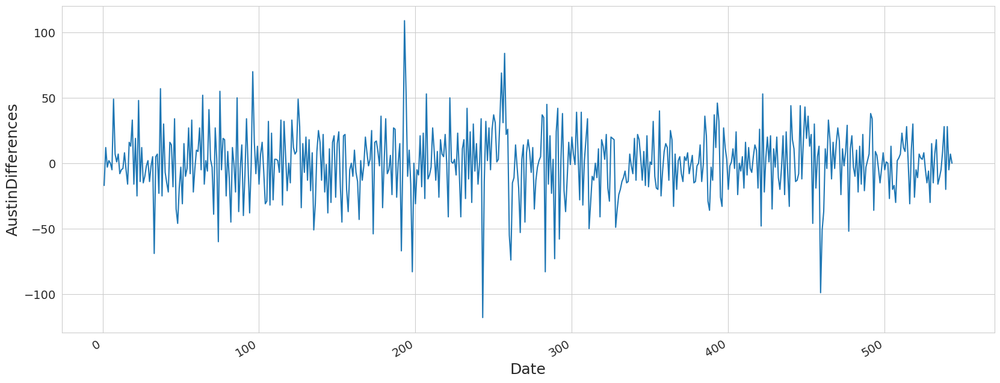

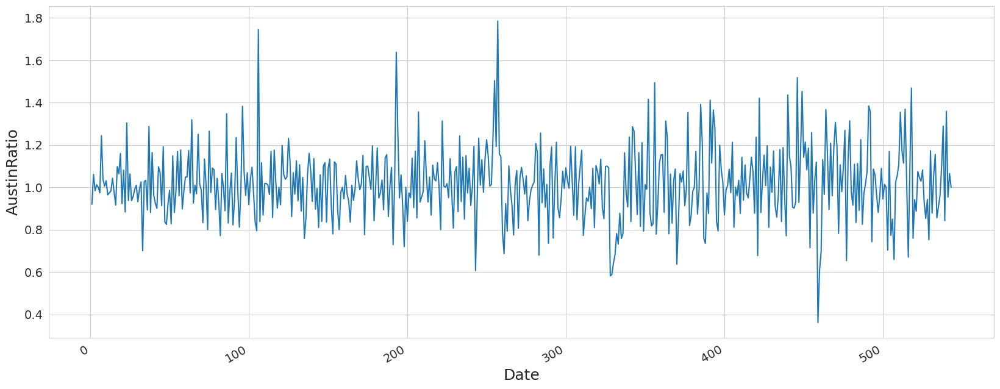

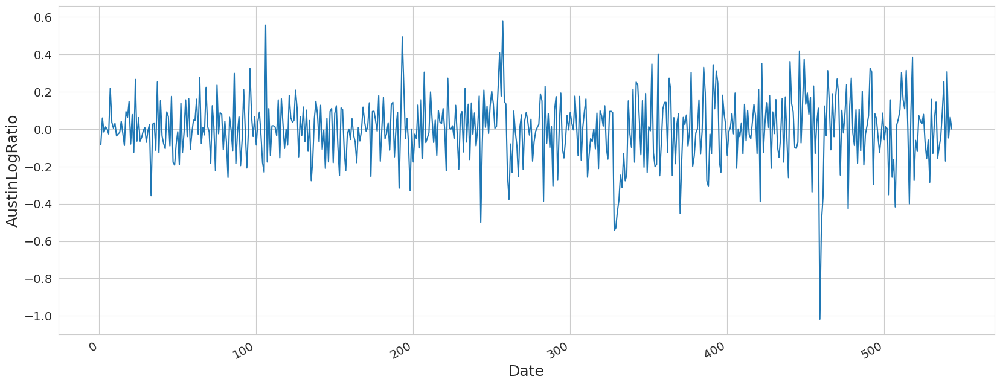

In [85]:
for col in col_list:
    plt.figure(figsize=(20,8))
    plt.plot(df.index, df[col])

    plt.xlabel("Date", fontsize=18)
    plt.ylabel(col, fontsize=18)

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.gcf().autofmt_xdate()

    plt.show()

In [86]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

In [87]:
# k = 10
# test size = 4 weeks
kfold = TimeSeriesSplit(n_splits = 10,
                           test_size = 4)

In [88]:
df_train = df.iloc[:-4].copy()
df_test = df.drop(df_train.index).copy()

In [89]:
# Baseline models
avg_rmses= np.zeros((10,10))
naive_rmses= np.zeros((10,10))
slr_rmses= np.zeros((10,10))
rw_drift_rmses= np.zeros((10,10))

i = 0
for train_index, test_index in kfold.split(df_train):
    df_tt = df_train.iloc[train_index]
    df_ho = df_train.iloc[test_index]
    for j in range(len(col_list)):
        
        # 1. Average forecast
        # forecast using average of training set
        df_tt_avg = df_tt[col_list[j]].mean()
        avg_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, df_tt_avg*np.ones(len(df_ho))))
        
        # 2. Naive forecast
        # forecast using last value of training set
        df_tt_naive = df_tt[col_list[j]].values[-1]
        naive_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, df_tt_naive*np.ones(len(df_ho))))
        
        
        # 3. Linear trend forecast
        # coefficients estimated through linear regression on training set
        slr = LinearRegression()
        slr.fit(np.array(df_tt.index).reshape(-1,1),
                df_tt[col_list[j]])
        pred = slr.predict(np.array(df_ho.index).reshape(-1,1))
        slr_rmses[j,i] = np.sqrt(mean_squared_error( df_ho[col_list[j]], pred))
        
        # 4. (Gaussian) random walk with drift
        beta_hat = (df_tt[col_list[j]].values[-1] - df_tt[col_list[j]].values[0])/len(df_tt)
        drift_pred = df_tt[col_list[j]].values[-1] + beta_hat*np.arange(1,len(df_ho) + 1)
        rw_drift_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]], drift_pred))
                
    i += 1
    
print(" Average: \n", avg_rmses.mean(axis=1))
print(" Naive: \n",naive_rmses.mean(axis=1))
print(" Linear: \n",slr_rmses.mean(axis=1))
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1))

 Average: 
 [ 8.16202739  8.63089    11.7299527   0.69851742  0.48677654 70.98233321
 69.25954568 15.53274198  0.17354157  0.17446487]
 Naive: 
 [10.26709609  9.61535151 14.13211977  0.90847347  0.58544357 16.29882741
 14.50560844 21.68218999  0.2407122   0.25052399]
 Linear: 
 [12.39586114  6.84979063 11.80517092  0.66301416  0.46572933 21.69253168
 21.31019641 15.59621045  0.17500367  0.17499638]
 Random walk with drift: 
 [10.28442278  9.63271232 14.15745675  0.90981686  0.58652209 16.49492641
 14.46582339 21.73069851  0.24132092  0.25118629]


In [90]:
import statsmodels.api as sm

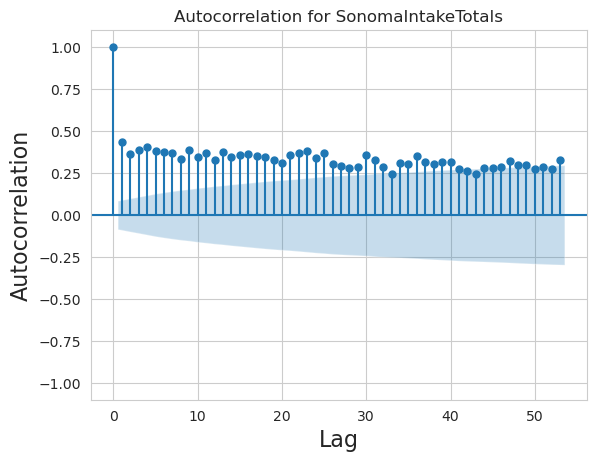

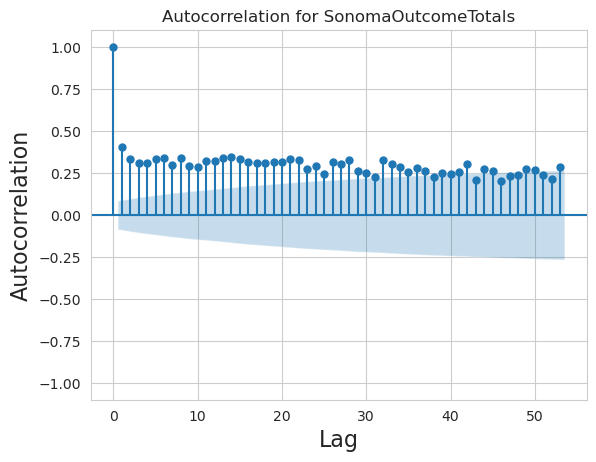

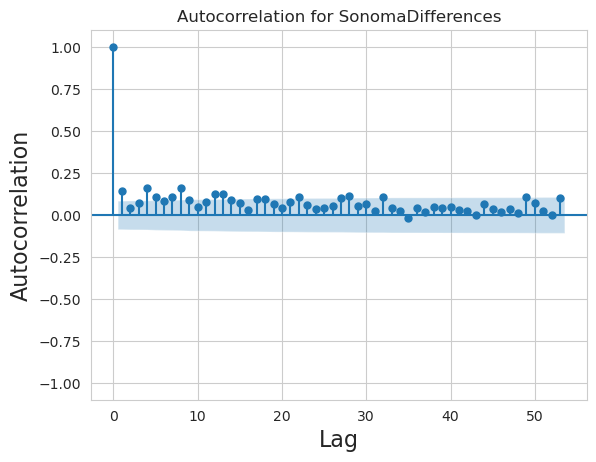

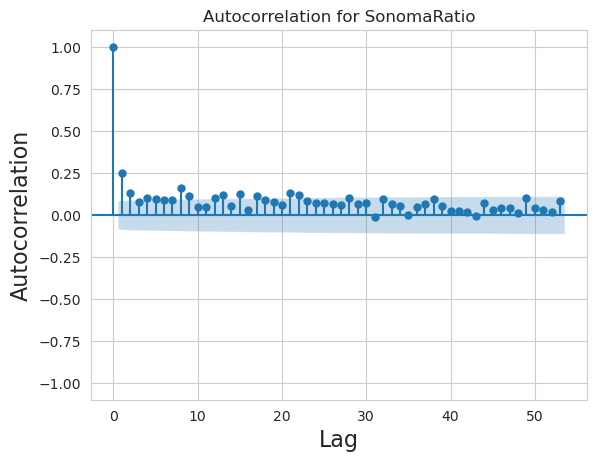

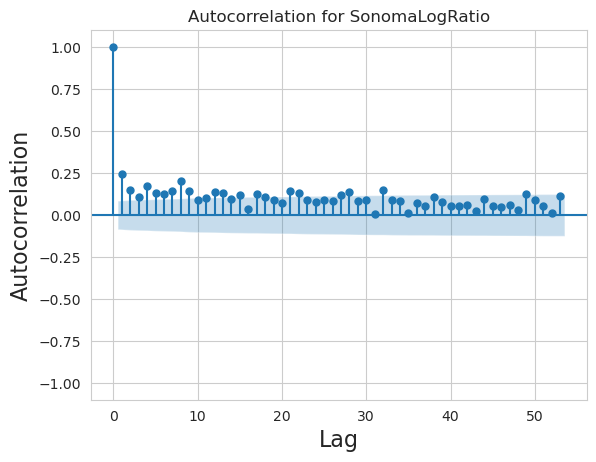

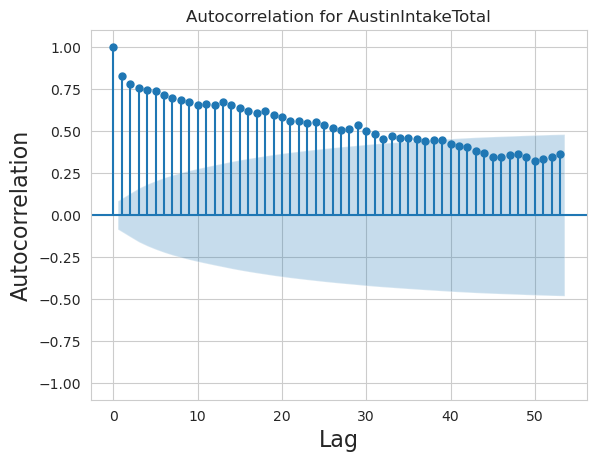

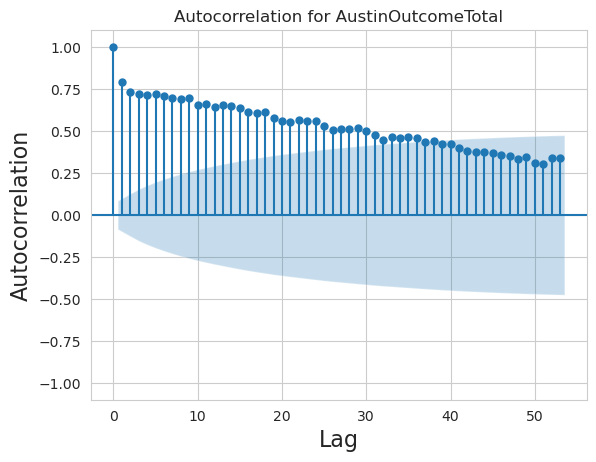

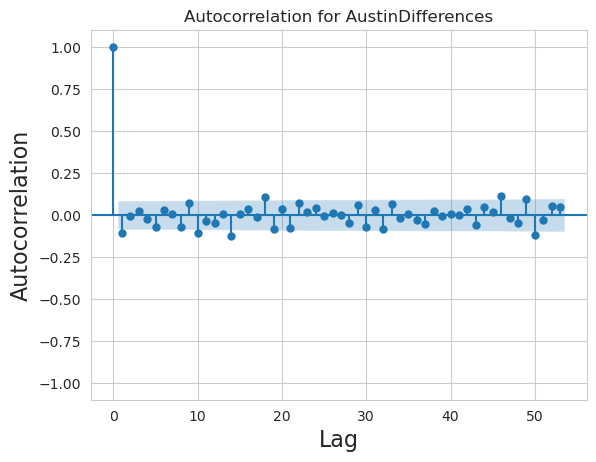

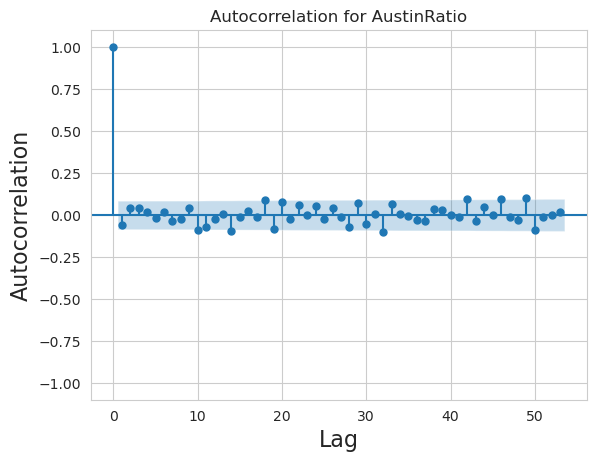

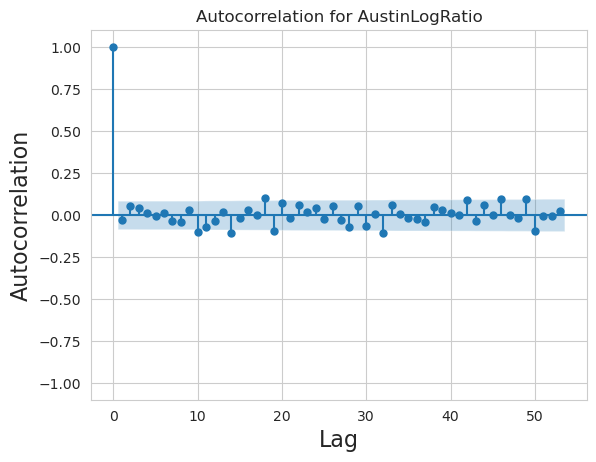

In [91]:
# Autocorrelation plots for starionarity and autocorrelation
for col in col_list:
    sm.graphics.tsa.plot_acf(df_train[col],
                                lags = 53)

    plt.title('Autocorrelation for ' + col, fontsize=12)
    plt.ylabel("Autocorrelation", fontsize=16)
    plt.xlabel("Lag", fontsize=16)

    plt.ylim(-1.1,1.1)

    plt.show()

### Observations:

Weekly is more interesting.

- both intakes/outcomes for Sonoma/Austing exhibit trend and (very weak) seasonality
- differences/ratios/logratios are random and exhibit (very weak) seasonality
- non-stationarity for both intakes/outcomes sonoma/austin (slow decline of autocorrelation) and the rest have stationarity

In [92]:
# One could also try seasonal_decompose to find seasonality/trend and adfuller to find stationarity
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

In [93]:
# for col in col_list:
#     try:
#         result_mul = seasonal_decompose(df_train[col], model='multiplicative',period=1)
#         result_add = seasonal_decompose(df_train[col], model='multiplicative',period=1)
#         result_mul.plot().suptitle("Mult decompose")
#         result_add.plot().suptitle("Add decompose")
#         plt.show()
#     except:
#         continue

In [94]:
# null hypothesis: time series possesses a unit root and is non-stationary
# i.e., if p-value > 0.05, accept null hypothesis
# output below agrees with the eyeball observation above
for col in col_list:
    result = adfuller(df_train[col], autolag='AIC')
    print(col)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    for key, value in result[4].items():
        print('Critial Values:')
        print(f'   {key}, {value}')


SonomaIntakeTotals
ADF Statistic: -2.344881440037061
p-value: 0.15790094689918377
Critial Values:
   1%, -3.442843345332837
Critial Values:
   5%, -2.867050445147657
Critial Values:
   10%, -2.5697048674984457
SonomaOutcomeTotals
ADF Statistic: -1.83331224581241
p-value: 0.36405295020433753
Critial Values:
   1%, -3.4428912664970523
Critial Values:
   5%, -2.867071538125014
Critial Values:
   10%, -2.5697161081813413
SonomaDifferences
ADF Statistic: -5.09100551723878
p-value: 1.4614711701528878e-05
Critial Values:
   1%, -3.4427251295084678
Critial Values:
   5%, -2.8669984098683736
Critial Values:
   10%, -2.5696771375119254
SonomaRatio
ADF Statistic: -5.525419494958886
p-value: 1.837426941819132e-06
Critial Values:
   1%, -3.4427251295084678
Critial Values:
   5%, -2.8669984098683736
Critial Values:
   10%, -2.5696771375119254
SonomaLogRatio
ADF Statistic: -4.894346316250553
p-value: 3.576891777205321e-05
Critial Values:
   1%, -3.4427251295084678
Critial Values:
   5%, -2.8669984098

In [88]:
#use auto_arima to find the optimal hyperparameters
from pmdarima import auto_arima
import statsmodels.tsa.api as sm

In [89]:
for i in range(len(col_list)):
    print(col_list[i])
    auto_arima(df_train[col_list[i]], trace=True)

SonomaIntakeTotals
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3817.716, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4103.884, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3989.856, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3818.172, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4101.884, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3818.582, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3818.523, Time=0.13 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3819.660, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3817.223, Time=0.74 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3817.691, Time=0.48 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3823.442, Time=0.76 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3819.675, Time=0.33 sec
 ARIMA(3,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(2,1,3)(0,0,0)[0] 

In [90]:
# ARIMA hyperparameters from the above cell
sonoma_intake_arima_model = sm.ARIMA(df_train["SonomaIntakeTotals"], order = (2,1,3)).fit()
sonoma_outcome_arima_model = sm.ARIMA(df_train["SonomaOutcomeTotals"], order = (1,1,1)).fit()
sonoma_diff_arima_model = sm.ARIMA(df_train["SonomaDifferences"], order = (0,1,1)).fit()
sonoma_ratio_arima_model = sm.ARIMA(df_train["SonomaRatio"], order = (1,1,1)).fit()
sonoma_logratio_arima_model = sm.ARIMA(df_train["SonomaLogRatio"], order = (0,1,2)).fit()
austin_intake_arima_model = sm.ARIMA(df_train["AustinIntakeTotal"], order = (1,1,1)).fit()
austin_outcome_arima_model = sm.ARIMA(df_train["AustinOutcomeTotal"], order = (0,1,2)).fit()
austin_diff_arima_model = sm.ARIMA(df_train["AustinDifferences"], order = (0,0,1)).fit()
austin_ratio_arima_model = sm.ARIMA(df_train["AustinRatio"], order = (0,0,0)).fit()
austin_logratio_arima_model = sm.ARIMA(df_train["AustinLogRatio"], order = (0,0,0)).fit()

arima_models = [sonoma_intake_arima_model,
                sonoma_outcome_arima_model,
                sonoma_diff_arima_model,
                sonoma_ratio_arima_model,
                sonoma_logratio_arima_model,
                austin_intake_arima_model,
                austin_outcome_arima_model,
                austin_diff_arima_model,
                austin_ratio_arima_model,
                austin_logratio_arima_model]

/home/jun/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [91]:
# Record ARIMA rmse's
arima_rmses= np.zeros((10,10))

i = 0
for train_index, test_index in kfold.split(df_train):
    df_tt = df_train.iloc[train_index]
    df_ho = df_train.iloc[test_index]
    for j in range(len(col_list)):
        
        # ARIMA forecast
        arima_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, arima_models[j].forecast(len(df_ho))))
                
    i += 1

In [92]:
print(" Average: \n", avg_rmses.mean(axis=1))
print(" Naive: \n",naive_rmses.mean(axis=1))
print(" Linear: \n",slr_rmses.mean(axis=1))
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1))
print(" ARIMA: \n", arima_rmses.mean(axis=1))

 Average: 
 [ 8.16202739  8.63089    11.7299527   0.69851742  0.48677654 70.98233321
 69.25954568 15.53274198  0.17354157  0.17446487]
 Naive: 
 [10.26709609  9.61535151 14.13211977  0.90847347  0.58544357 16.29882741
 14.50560844 21.68218999  0.2407122   0.25052399]
 Linear: 
 [12.39586114  6.84979063 11.80517092  0.66301416  0.46572933 21.69253168
 21.31019641 15.59621045  0.17500367  0.17499638]
 Random walk with drift: 
 [10.28442278  9.63271232 14.15745675  0.90981686  0.58652209 16.49492641
 14.46582339 21.73069851  0.24132092  0.25118629]
 ARIMA: 
 [ 8.56821281  6.63246936 10.11765209  0.64143242  0.41031839 23.32124854
 23.88701698 15.57001191  0.17329684  0.17422721]


In [120]:
print(" Average: \n", avg_rmses.mean(axis=1)/weekly_maxmindiff)
print(" Naive: \n",naive_rmses.mean(axis=1)/weekly_maxmindiff)
print(" Linear: \n",slr_rmses.mean(axis=1)/weekly_maxmindiff)
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1)/weekly_maxmindiff)
print(" ARIMA: \n", arima_rmses.mean(axis=1)/weekly_maxmindiff)

 Average: 
 SonomaIntakeTotals     0.121821
SonomaOutcomeTotals    0.113564
SonomaDifferences      0.152337
SonomaRatio            0.145524
SonomaLogRatio         0.151226
AustinIntakeTotal      0.266851
AustinOutcomeTotal     0.244733
AustinDifferences      0.068426
AustinRatio            0.121890
AustinLogRatio         0.109210
dtype: float64
 Naive: 
 SonomaIntakeTotals     0.153240
SonomaOutcomeTotals    0.126518
SonomaDifferences      0.183534
SonomaRatio            0.189265
SonomaLogRatio         0.181878
AustinIntakeTotal      0.061274
AustinOutcomeTotal     0.051257
AustinDifferences      0.095516
AustinRatio            0.169068
AustinLogRatio         0.156821
dtype: float64
 Linear: 
 SonomaIntakeTotals     0.185013
SonomaOutcomeTotals    0.090129
SonomaDifferences      0.153314
SonomaRatio            0.138128
SonomaLogRatio         0.144687
AustinIntakeTotal      0.081551
AustinOutcomeTotal     0.075301
AustinDifferences      0.068706
AustinRatio            0.122917
AustinLog

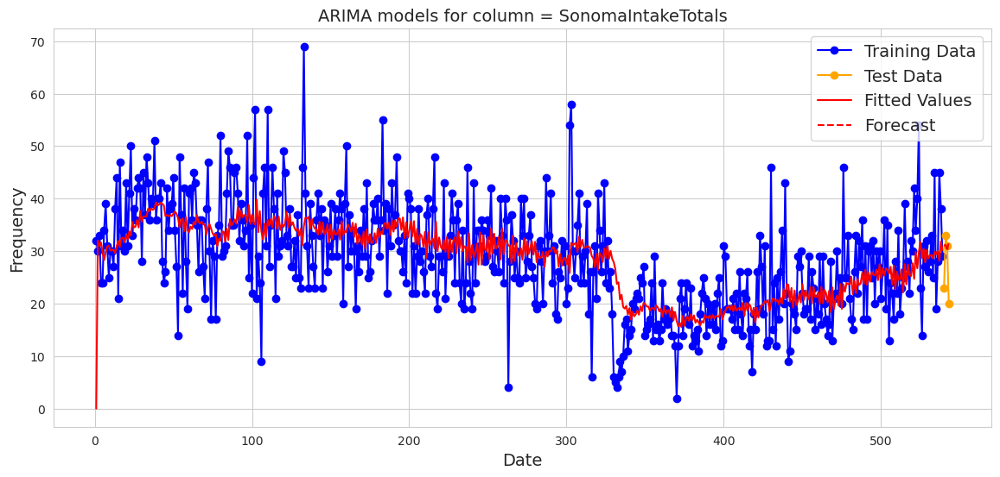

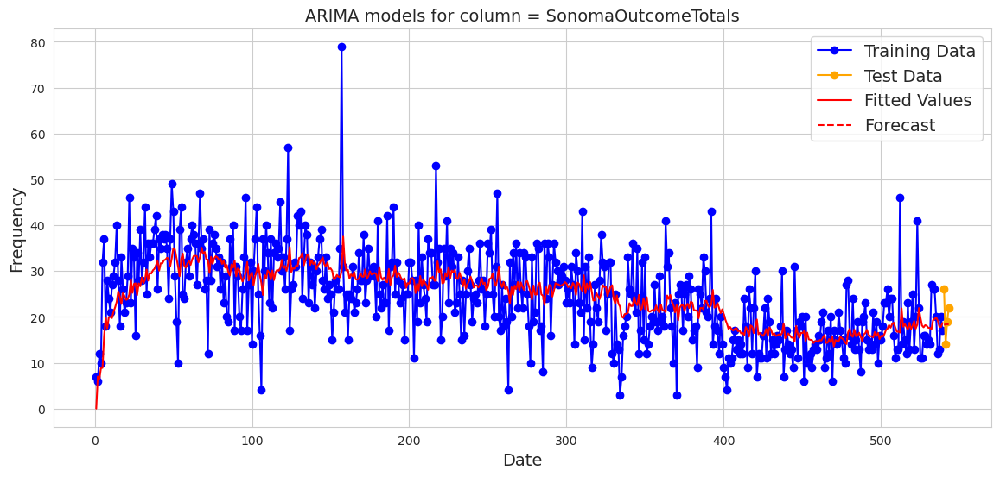

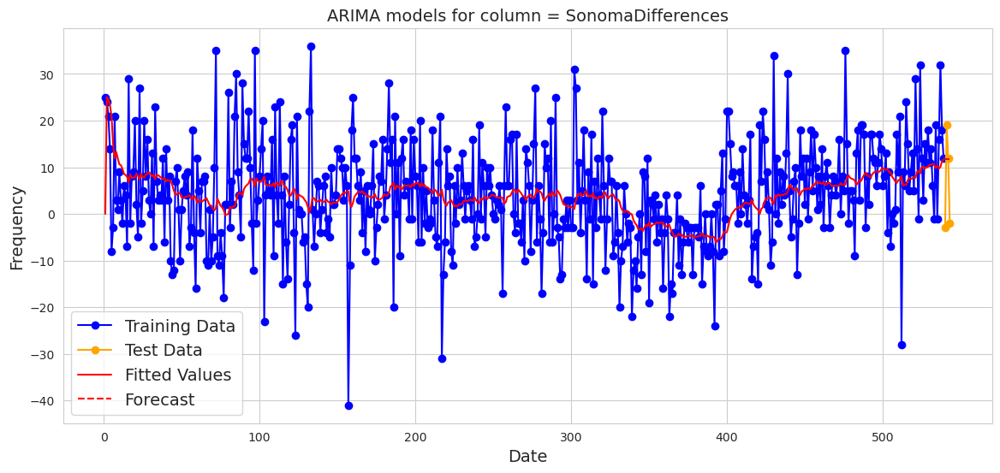

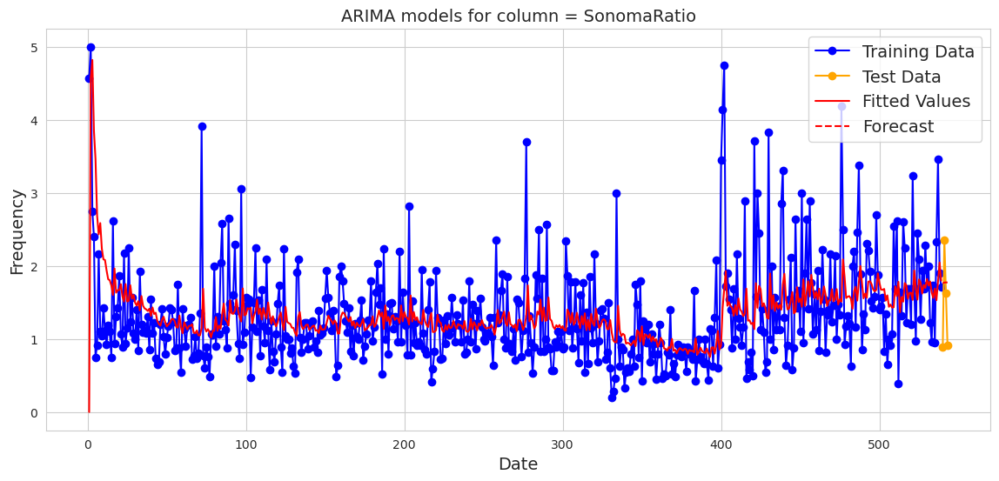

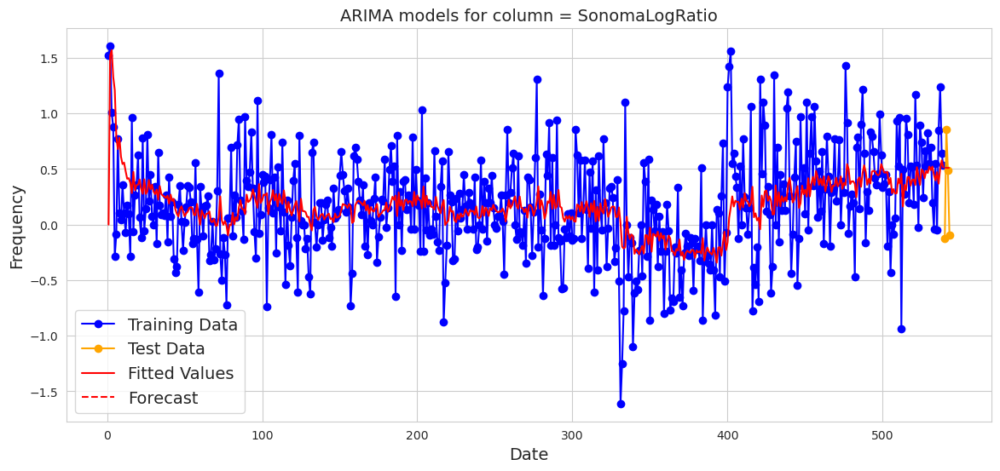

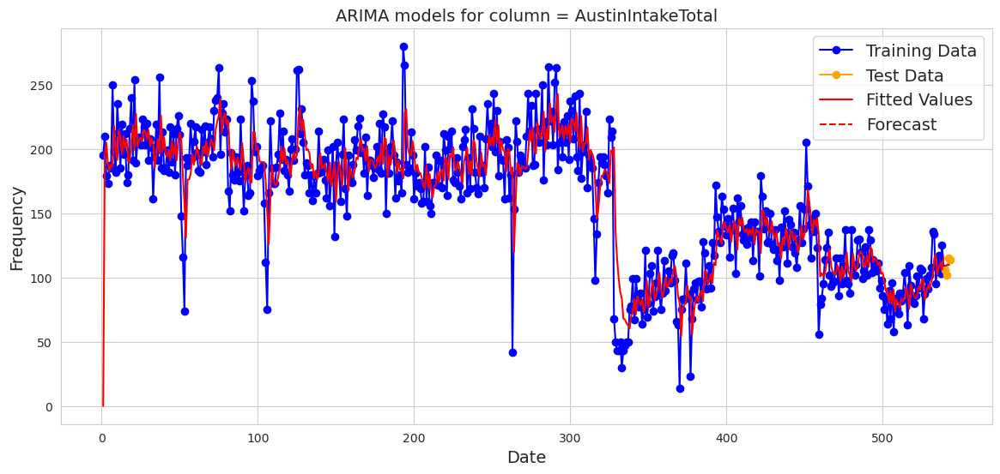

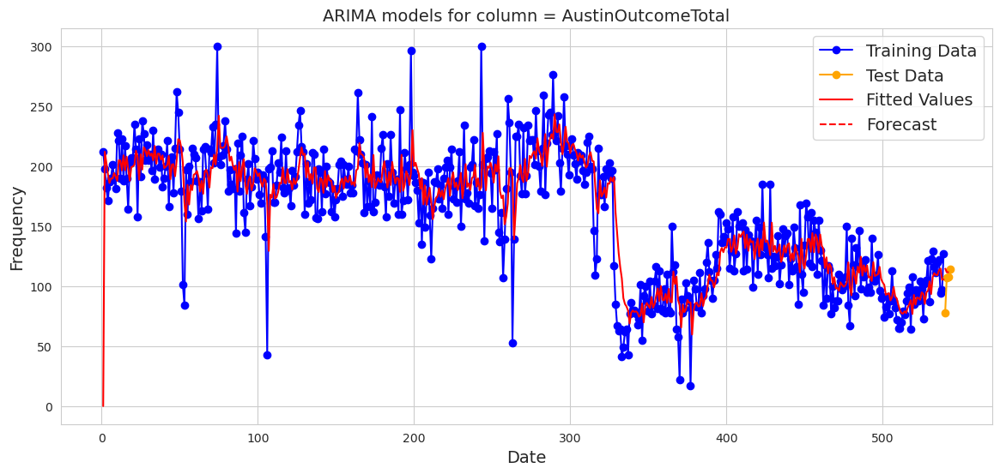

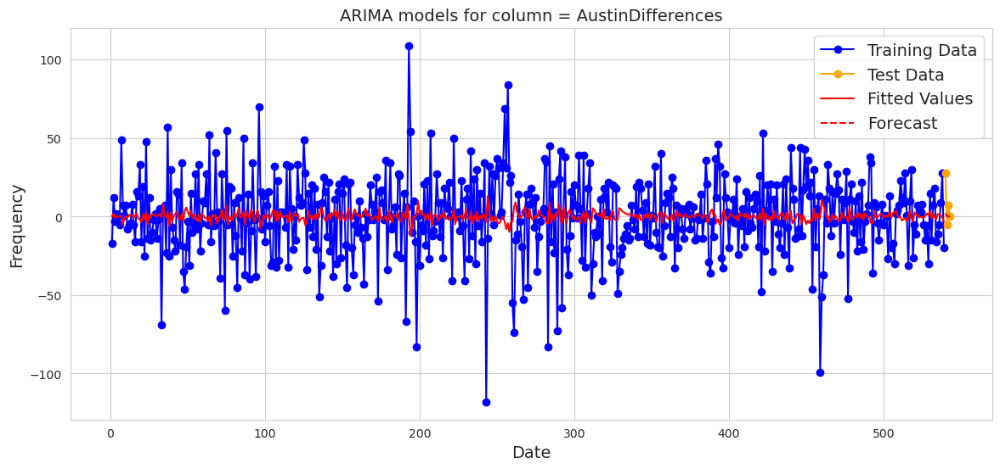

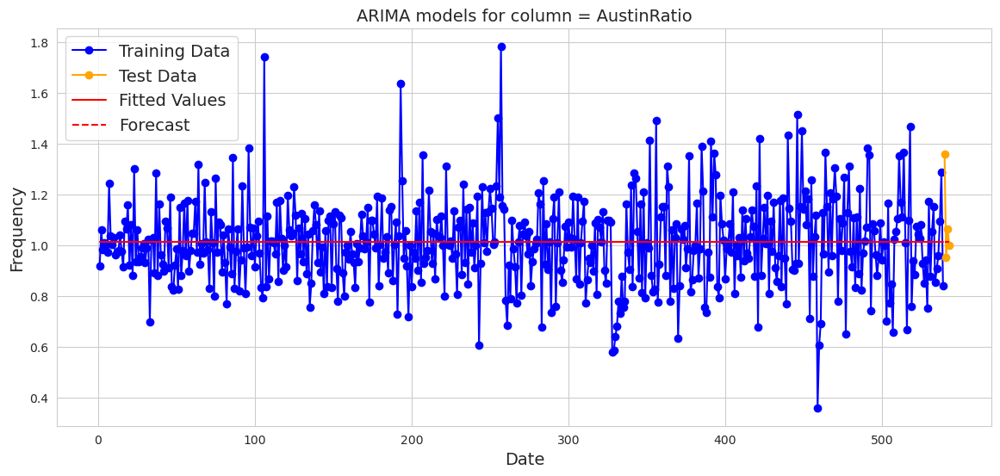

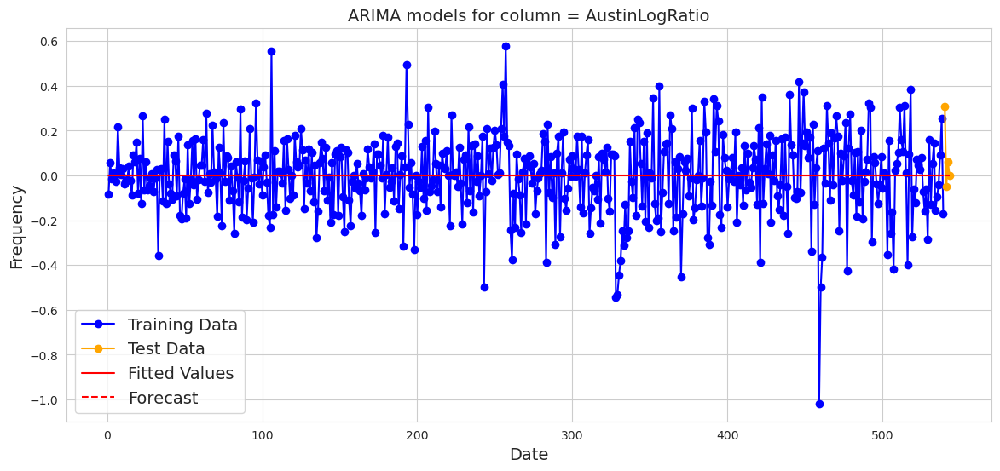

In [93]:
for i in range(len(col_list)):
    plt.figure(figsize=(14,6))

    plt.plot(df_train.index,
                df_train[col_list[i]],
                'b-o',
                label='Training Data')

    plt.plot(df_test.index,
                df_test[col_list[i]],
                color = 'orange',
                marker = 'o',
                label='Test Data')

    plt.plot(df_train.index,
                arima_models[i].fittedvalues,
                'r',
                label='Fitted Values')

    plt.plot(df_test.index,
                arima_models[i].forecast(len(df_test)),
                '--r',
                label="Forecast")

    plt.title("ARIMA models for column = " + col_list[i], fontsize=14)
    plt.legend(fontsize=14)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)

    plt.show()

In [ ]:
# Autocorrelation plots for starionarity and autocorrelation
for col in col_list:
    sm.graphics.tsa.plot_pacf(df_train[col],
                                lags = 13)

    plt.title('Autocorrelation for ' + col, fontsize=12)
    plt.ylabel("Autocorrelation", fontsize=16)
    plt.xlabel("Lag", fontsize=16)

    plt.ylim(-1.1,1.1)

    plt.show()

### Do the above for monthly

In [95]:
# Redo everything just in case

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from seaborn import set_style

from datetime import datetime

set_style("whitegrid")

In [96]:
df = pd.read_csv("../main_data/CleanedDataOnePlace.csv", parse_dates=["Date"])
df = df.loc[(df["Date"] >= pd.Timestamp(year = 2014, month = 1,day=1) ) & (df["Date"] <= pd.Timestamp(year = 2024, month = 5,day=1) )]

/tmp/ipykernel_43995/837667854.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv("../main_data/CleanedDataOnePlace.csv", parse_dates=["Date"])


In [97]:
# create DF with year/month as column
df = df.groupby(df['Date'].dt.to_period('M'))[["SonomaIntakeTotals","SonomaOutcomeTotals","AustinIntakeTotal","AustinOutcomeTotal"]].sum().reset_index()

In [98]:
# Create extra columns
df["SonomaDifferences"] = df["SonomaIntakeTotals"] - df["SonomaOutcomeTotals"]
df["AustinDifferences"] = df["AustinIntakeTotal"] - df["AustinOutcomeTotal"]
df["SonomaRatio"] = df["SonomaIntakeTotals"] / df["SonomaOutcomeTotals"]
df["AustinRatio"] = df["AustinIntakeTotal"] / df["AustinOutcomeTotal"]
df["SonomaLogRatio"] = np.log(df["SonomaRatio"])
df["AustinLogRatio"] = np.log(df["AustinRatio"])

In [99]:
# convert Period to Timestamp
df["Date"] = df["Date"].dt.to_timestamp()

# There are some divisions by 0, replace by nan and remove such rows
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df = df[df["SonomaRatio"].notna() & df["AustinRatio"].notna() & df["SonomaRatio"]].reset_index(drop=True)

In [100]:
col_list = ["SonomaIntakeTotals", "SonomaOutcomeTotals","SonomaDifferences","SonomaRatio", "SonomaLogRatio","AustinIntakeTotal","AustinOutcomeTotal","AustinDifferences","AustinRatio", "AustinLogRatio"]

In [101]:
monthly_maxmindiff = (df[col_list].max(axis=0) - df[col_list].min(axis=0))

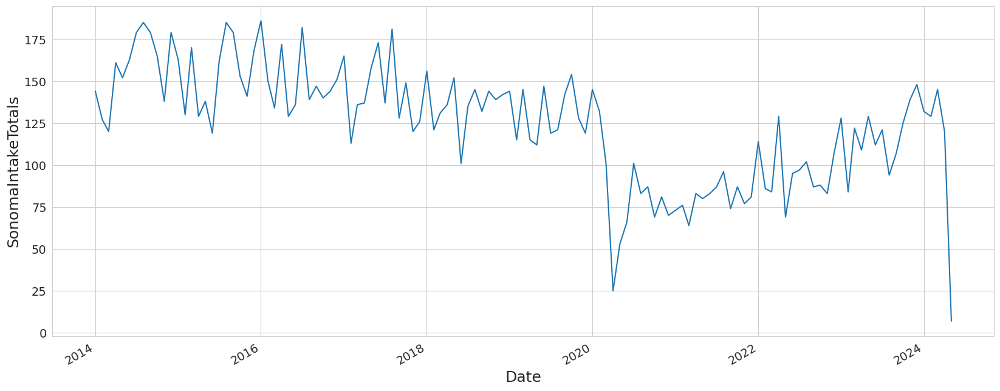

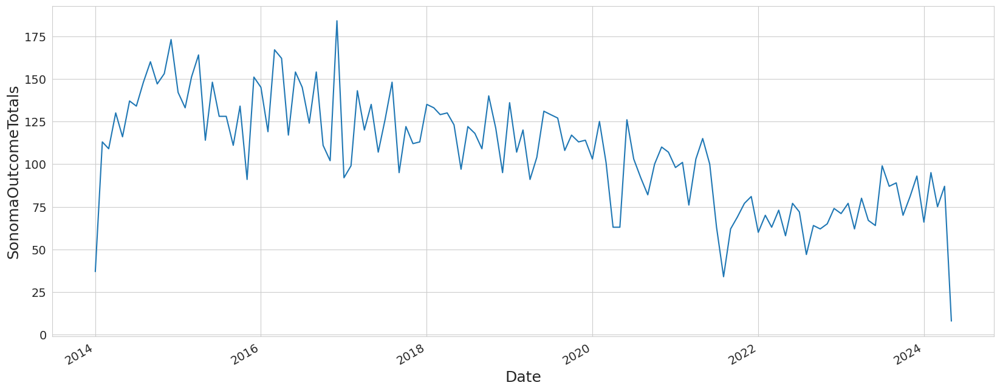

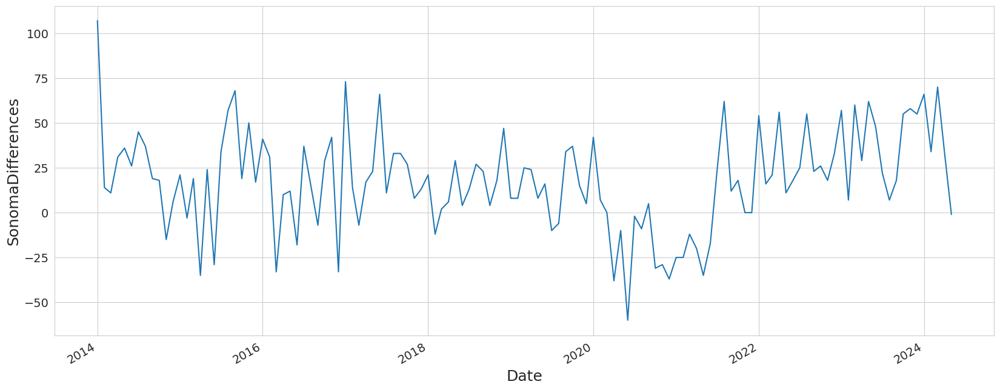

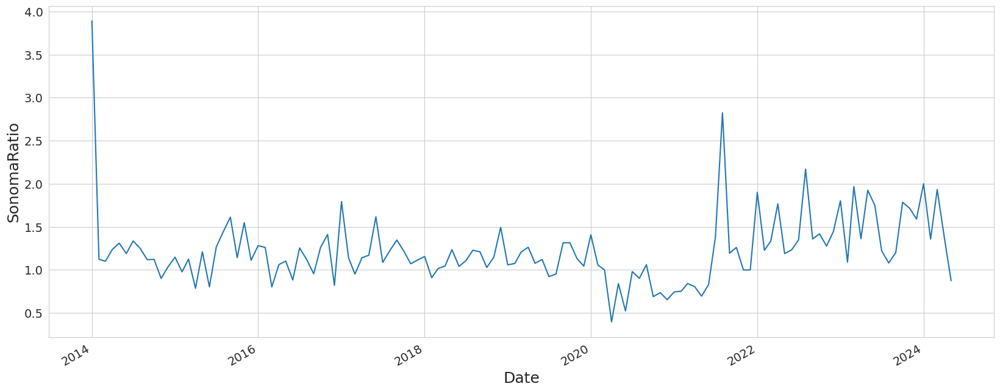

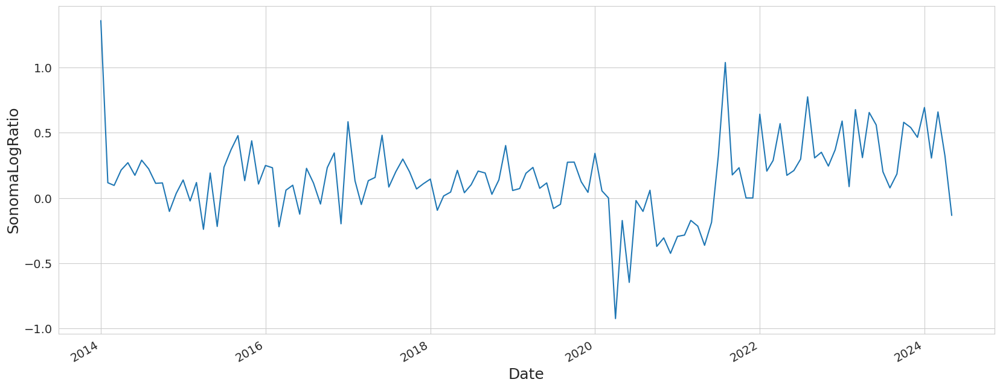

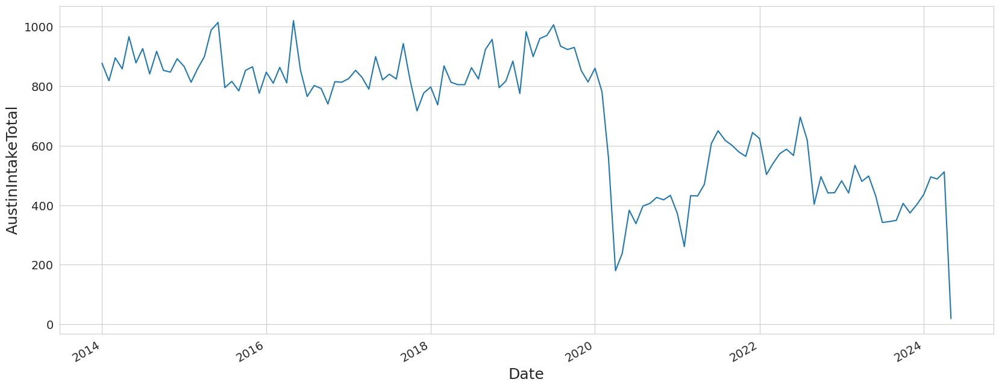

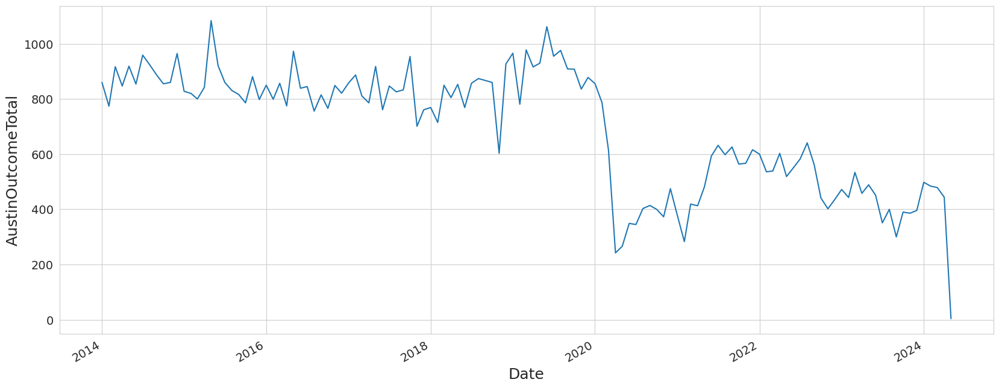

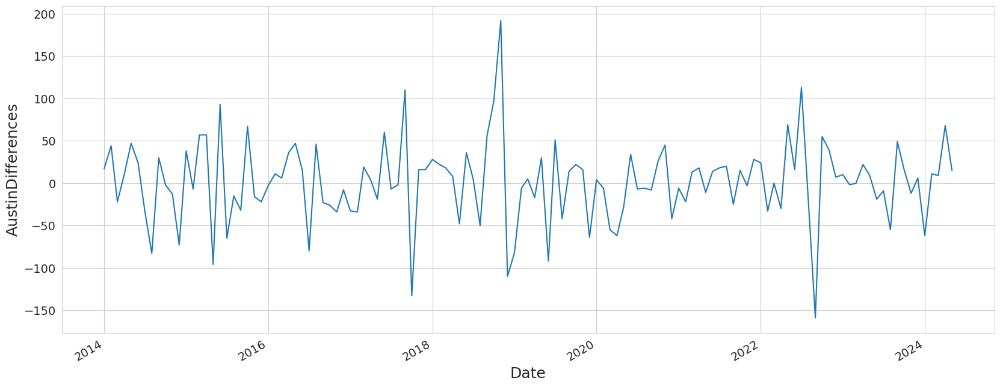

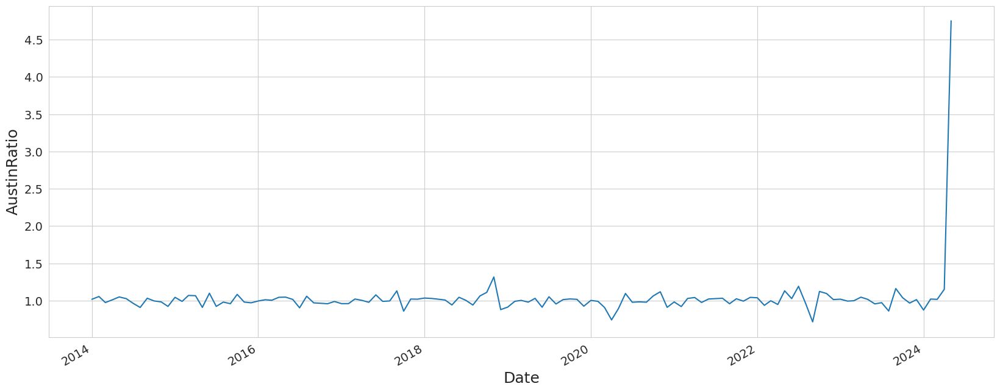

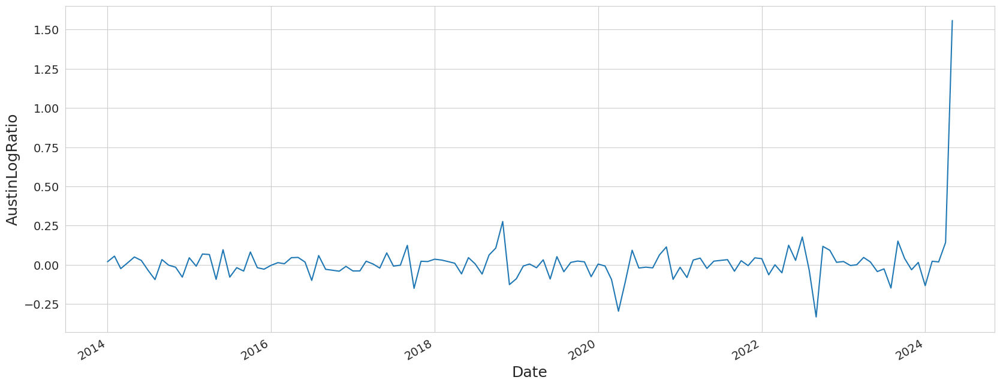

In [103]:
for col in col_list:
    plt.figure(figsize=(20,8))
    plt.plot(df["Date"], df[col])

    plt.xlabel("Date", fontsize=18)
    plt.ylabel(col, fontsize=18)

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.gcf().autofmt_xdate()

    plt.show()

In [104]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

In [105]:
# k = 5
# test size = 14 days
kfold = TimeSeriesSplit(n_splits = 5,
                           test_size = 3)

In [106]:
df_train = df.iloc[:-3].copy()
df_test = df.drop(df_train.index).copy()

In [107]:
# Baseline models
avg_rmses= np.zeros((10,5))
naive_rmses= np.zeros((10,5))
slr_rmses= np.zeros((10,5))
rw_drift_rmses= np.zeros((10,5))

i = 0
for train_index, test_index in kfold.split(df_train):
    df_tt = df_train.iloc[train_index]
    df_ho = df_train.iloc[test_index]
    for j in range(len(col_list)):
        
        # 1. Average forecast
        # forecast using average of training set
        df_tt_avg = df_tt[col_list[j]].mean()
        avg_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, df_tt_avg*np.ones(len(df_ho))))
        
        # 2. Naive forecast
        # forecast using last value of training set
        df_tt_naive = df_tt[col_list[j]].values[-1]
        naive_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, df_tt_naive*np.ones(len(df_ho))))
        
        
        # 3. Linear trend forecast
        # coefficients estimated through linear regression on training set
        slr = LinearRegression()
        slr.fit(np.array(df_tt.index).reshape(-1,1),
                df_tt[col_list[j]])
        pred = slr.predict(np.array(df_ho.index).reshape(-1,1))
        slr_rmses[j,i] = np.sqrt(mean_squared_error( df_ho[col_list[j]], pred))
        
        # 4. (Gaussian) random walk with drift
        beta_hat = (df_tt[col_list[j]].values[-1] - df_tt[col_list[j]].values[0])/len(df_tt)
        drift_pred = df_tt[col_list[j]].values[-1] + beta_hat*np.arange(1,len(df_ho) + 1)
        rw_drift_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]], drift_pred))
                
    i += 1
    
print(" Average: \n", avg_rmses.mean(axis=1))
print(" Naive: \n",naive_rmses.mean(axis=1))
print(" Linear: \n",slr_rmses.mean(axis=1))
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1))

 Average: 
 [1.66969574e+01 3.33618204e+01 3.13898987e+01 4.63302900e-01
 3.47533224e-01 2.97701121e+02 2.95507833e+02 2.43349992e+01
 6.02857048e-02 6.13559617e-02]
 Naive: 
 [26.10239385 13.1860143  33.31286001  0.50431099  0.34292509 68.31009527
 70.41573594 40.31434265  0.09973792  0.10138204]
 Linear: 
 [4.04881983e+01 1.30230541e+01 3.56655570e+01 4.57783141e-01
 3.48820214e-01 6.53312807e+01 6.84007000e+01 2.45171183e+01
 6.09127792e-02 6.24146520e-02]
 Random walk with drift: 
 [26.59826064 13.17763768 33.8921098   0.51802015  0.34928359 72.96195661
 72.98508744 40.63059057  0.10054065  0.10220292]


In [108]:
import statsmodels.api as sm

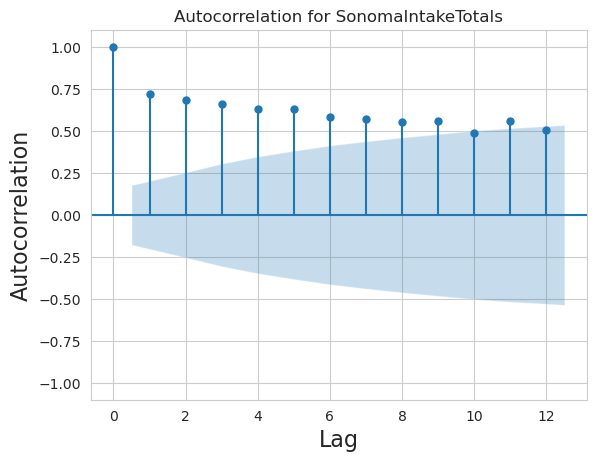

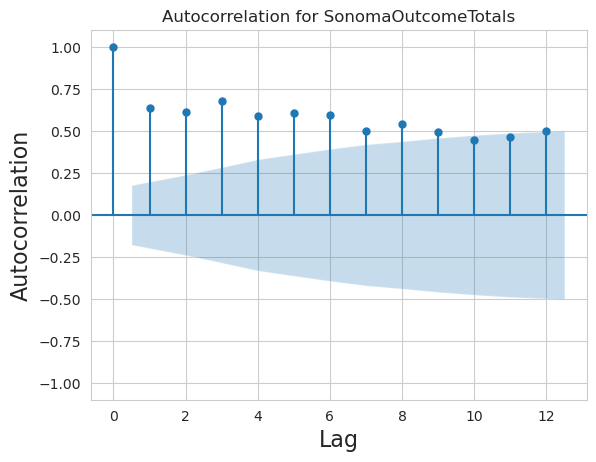

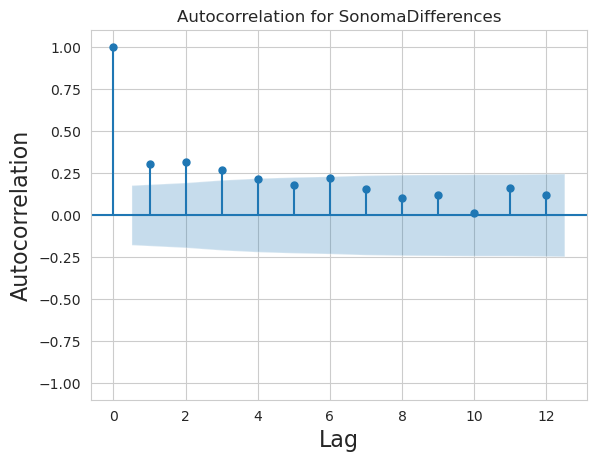

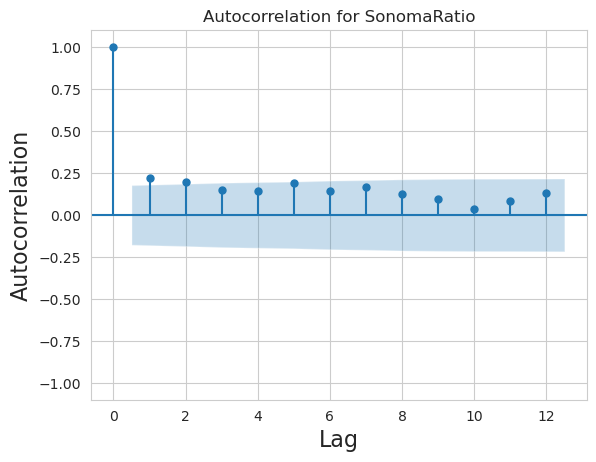

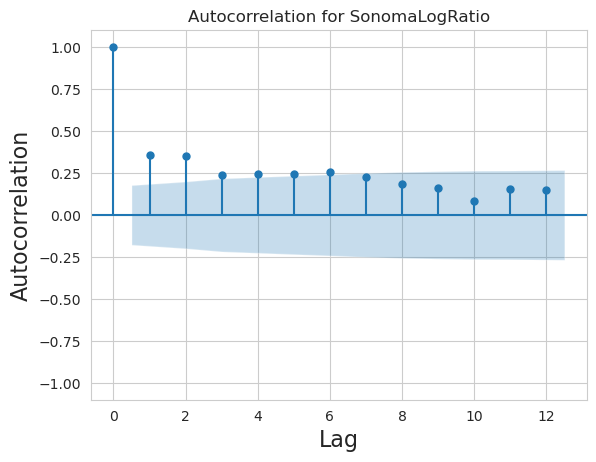

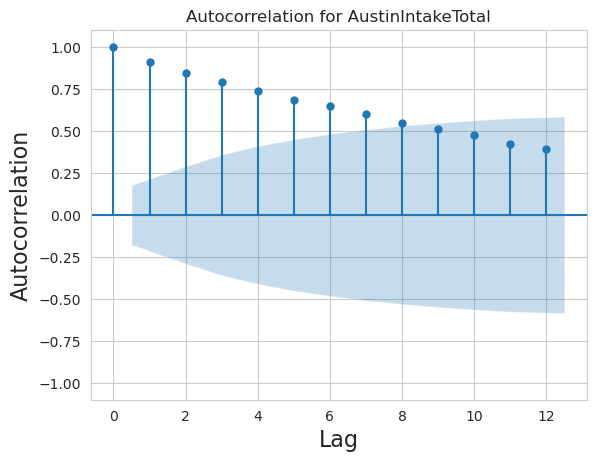

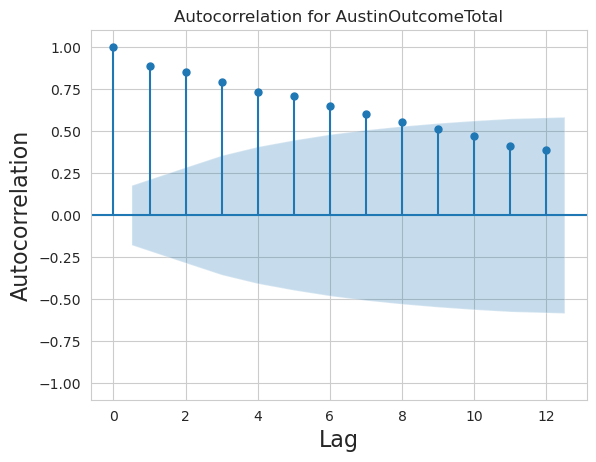

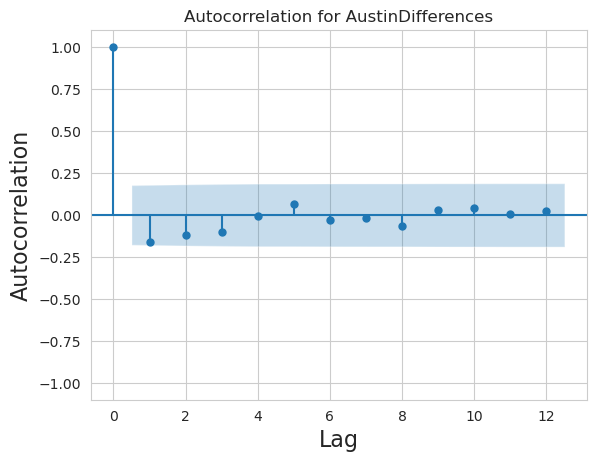

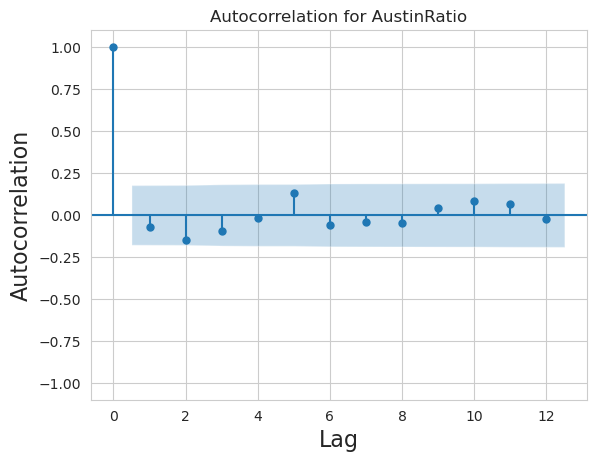

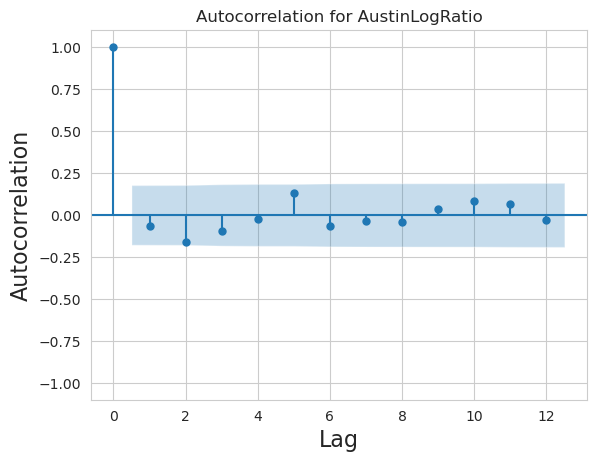

In [109]:
# Autocorrelation plots for starionarity and autocorrelation
for col in col_list:
    sm.graphics.tsa.plot_acf(df_train[col],
                                lags = 12)

    plt.title('Autocorrelation for ' + col, fontsize=12)
    plt.ylabel("Autocorrelation", fontsize=16)
    plt.xlabel("Lag", fontsize=16)

    plt.ylim(-1.1,1.1)

    plt.show()

### Observations:

Monthly is more interesting.

- both intakes/outcomes for Sonoma/Austing exhibit trend and (weak) seasonality
- differences/ratios/logratios are random but exhibit (very weak) seasonality
- non-stationarity for intakes/outcomes sonoma/austin (slow decline of autocorrelation) and the rest stationary

In [ ]:
# One could also try seasonal_decompose to find seasonality/trend and adfuller to find stationarity
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller


In [ ]:
# for col in col_list:
#     try:
#         result_mul = seasonal_decompose(df_train[col], model='multiplicative',period=1)
#         result_add = seasonal_decompose(df_train[col], model='multiplicative',period=1)
#         result_mul.plot().suptitle("Mult decompose")
#         result_add.plot().suptitle("Add decompose")
#         plt.show()
#     except:
#         continue

In [110]:
# null hypothesis: time series possesses a unit root and is non-stationary
# i.e., if p-value > 0.05, accept null hypothesis
# output below agrees with the eyeball observation above
for col in col_list:
    result = adfuller(df_train[col], autolag='AIC')
    print(col)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    for key, value in result[4].items():
        print('Critial Values:')
        print(f'   {key}, {value}')


SonomaIntakeTotals
ADF Statistic: -1.6453903769599598
p-value: 0.4594455745325518
Critial Values:
   1%, -3.487517288664615
Critial Values:
   5%, -2.8865777180380032
Critial Values:
   10%, -2.5801239192052012
SonomaOutcomeTotals
ADF Statistic: -1.2506470972030637
p-value: 0.651438301494285
Critial Values:
   1%, -3.487517288664615
Critial Values:
   5%, -2.8865777180380032
Critial Values:
   10%, -2.5801239192052012
SonomaDifferences
ADF Statistic: -3.5684206793069735
p-value: 0.006394261457795977
Critial Values:
   1%, -3.4865346059036564
Critial Values:
   5%, -2.8861509858476264
Critial Values:
   10%, -2.579896092790057
SonomaRatio
ADF Statistic: -2.7085116709464336
p-value: 0.07257692409603257
Critial Values:
   1%, -3.487517288664615
Critial Values:
   5%, -2.8865777180380032
Critial Values:
   10%, -2.5801239192052012
SonomaLogRatio
ADF Statistic: -4.5889256270612355
p-value: 0.00013537871602081644
Critial Values:
   1%, -3.486055829282407
Critial Values:
   5%, -2.88594303240

In [37]:
#use auto_arima to find the optimal hyperparameters
from pmdarima import auto_arima
import statsmodels.tsa.api as sm

In [38]:
for i in range(len(col_list)):
    print(col_list[i])
    auto_arima(df_train[col_list[i]], trace=True)

SonomaIntakeTotals
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1074.804, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1108.917, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1085.731, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1070.921, Time=0.02 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1106.918, Time=0.00 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1072.349, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1072.399, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1072.864, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1068.946, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1070.415, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1070.457, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1083.735, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1070.900, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 0.319 seconds
Son

In [39]:
# ARIMA hyperparameters from the above cell
sonoma_intake_arima_model = sm.ARIMA(df_train["SonomaIntakeTotals"], order = (0,1,1)).fit()
sonoma_outcome_arima_model = sm.ARIMA(df_train["SonomaOutcomeTotals"], order = (0,1,1)).fit()
sonoma_diff_arima_model = sm.ARIMA(df_train["SonomaDifferences"], order = (1,0,1)).fit()
sonoma_ratio_arima_model = sm.ARIMA(df_train["SonomaRatio"], order = (0,1,1)).fit()
sonoma_logratio_arima_model = sm.ARIMA(df_train["SonomaLogRatio"], order = (1,0,1)).fit()
austin_intake_arima_model = sm.ARIMA(df_train["AustinIntakeTotal"], order = (0,1,1)).fit()
austin_outcome_arima_model = sm.ARIMA(df_train["AustinOutcomeTotal"], order = (0,1,1)).fit()
austin_diff_arima_model = sm.ARIMA(df_train["AustinDifferences"], order = (1,0,1)).fit()
austin_ratio_arima_model = sm.ARIMA(df_train["AustinRatio"], order = (0,0,0)).fit()
austin_logratio_arima_model = sm.ARIMA(df_train["AustinLogRatio"], order = (0,0,0)).fit()

arima_models = [sonoma_intake_arima_model,
                sonoma_outcome_arima_model,
                sonoma_diff_arima_model,
                sonoma_ratio_arima_model,
                sonoma_logratio_arima_model,
                austin_intake_arima_model,
                austin_outcome_arima_model,
                austin_diff_arima_model,
                austin_ratio_arima_model,
                austin_logratio_arima_model]

/home/jun/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [40]:
# Record ARIMA rmse's
arima_rmses= np.zeros((10,5))

i = 0
for train_index, test_index in kfold.split(df_train):
    df_tt = df_train.iloc[train_index]
    df_ho = df_train.iloc[test_index]
    for j in range(len(col_list)):
        
        # ARIMA forecast
        arima_rmses[j,i] = np.sqrt(mean_squared_error(df_ho[col_list[j]].values, arima_models[j].forecast(len(df_ho))))
                
    i += 1

RMSE's of models used:

In [41]:
print(" Average: \n", avg_rmses.mean(axis=1))
print(" Naive: \n",naive_rmses.mean(axis=1))
print(" Linear: \n",slr_rmses.mean(axis=1))
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1))
print(" ARIMA: \n", arima_rmses.mean(axis=1))

 Average: 
 [1.96849050e+01 3.60872367e+01 3.17115559e+01 4.84239588e-01
 3.57163137e-01 3.03622498e+02 3.03670774e+02 2.59968335e+01
 6.34481427e-02 6.37676955e-02]
 Naive: 
 [20.19319857 13.4118827  20.40869079  0.3278927   0.21360014 46.22261962
 48.57470513 34.87637353  0.08399462  0.08289135]
 Linear: 
 [3.87446746e+01 1.31247648e+01 3.44350122e+01 4.29434192e-01
 3.36411388e-01 6.87671687e+01 7.38965582e+01 2.62564006e+01
 6.42116161e-02 6.46595785e-02]
 Random walk with drift: 
 [20.39044153 13.70992627 20.3112908   0.327636    0.21345031 46.85902242
 50.14093512 34.85887746  0.08436462  0.08322878]
 ARIMA: 
 [21.96652668 10.99306836 20.85506355  0.31566218  0.21256072 53.5969474
 62.73051994 27.06621702  0.06320697  0.06354329]


NRMSE's of models used (NRMSE = RMSE/max - min):

In [42]:
print(" Average: \n", avg_rmses.mean(axis=1)/monthly_maxmindiff)
print(" Naive: \n",naive_rmses.mean(axis=1)/monthly_maxmindiff)
print(" Linear: \n",slr_rmses.mean(axis=1)/monthly_maxmindiff)
print(" Random walk with drift: \n", rw_drift_rmses.mean(axis=1)/monthly_maxmindiff)
print(" ARIMA: \n", arima_rmses.mean(axis=1)/monthly_maxmindiff)

 Average: 
 SonomaIntakeTotals     0.122266
SonomaOutcomeTotals    0.240582
SonomaDifferences      0.238433
SonomaRatio            0.199546
SonomaLogRatio         0.182017
AustinIntakeTotal      0.361455
AustinOutcomeTotal     0.360654
AustinDifferences      0.074065
AustinRatio            0.105514
AustinLogRatio         0.104711
dtype: float64
 Naive: 
 SonomaIntakeTotals     0.125424
SonomaOutcomeTotals    0.089413
SonomaDifferences      0.153449
SonomaRatio            0.135119
SonomaLogRatio         0.108855
AustinIntakeTotal      0.055027
AustinOutcomeTotal     0.057690
AustinDifferences      0.099363
AustinRatio            0.139682
AustinLogRatio         0.136113
dtype: float64
 Linear: 
 SonomaIntakeTotals     0.240650
SonomaOutcomeTotals    0.087498
SonomaDifferences      0.258910
SonomaRatio            0.176962
SonomaLogRatio         0.171442
AustinIntakeTotal      0.081866
AustinOutcomeTotal     0.087763
AustinDifferences      0.074805
AustinRatio            0.106783
AustinLog

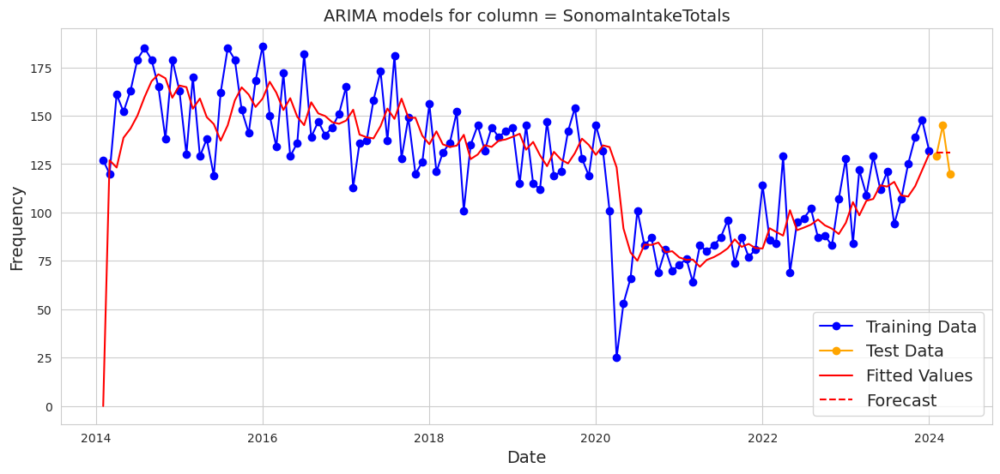

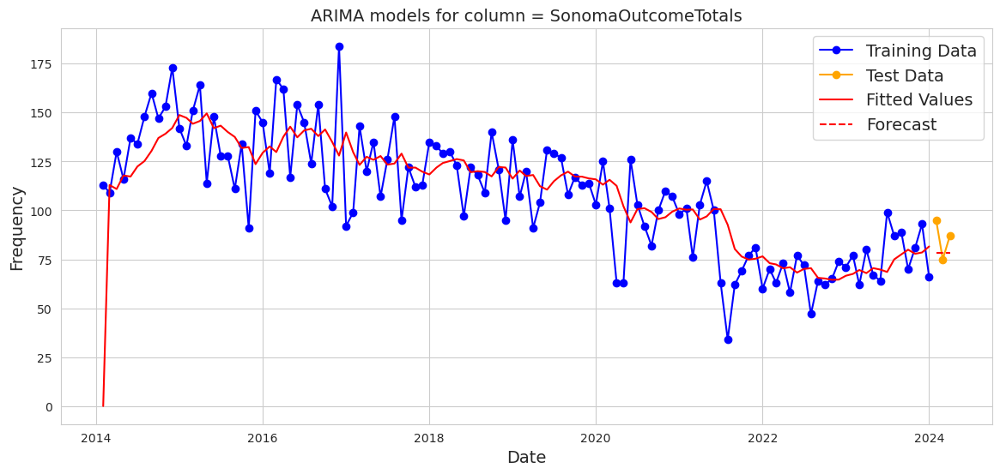

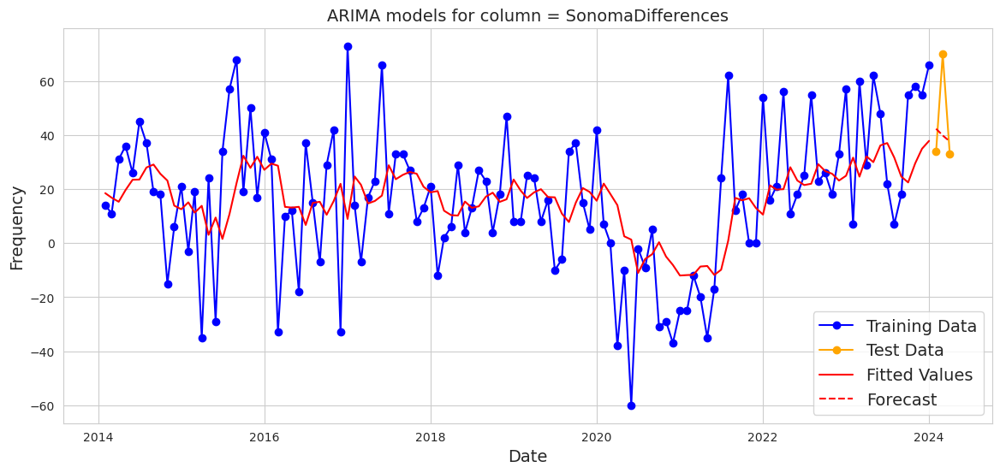

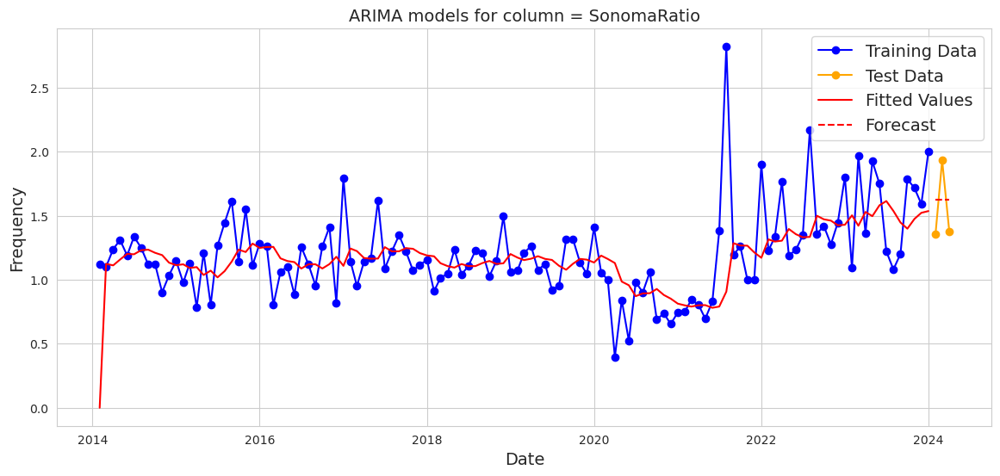

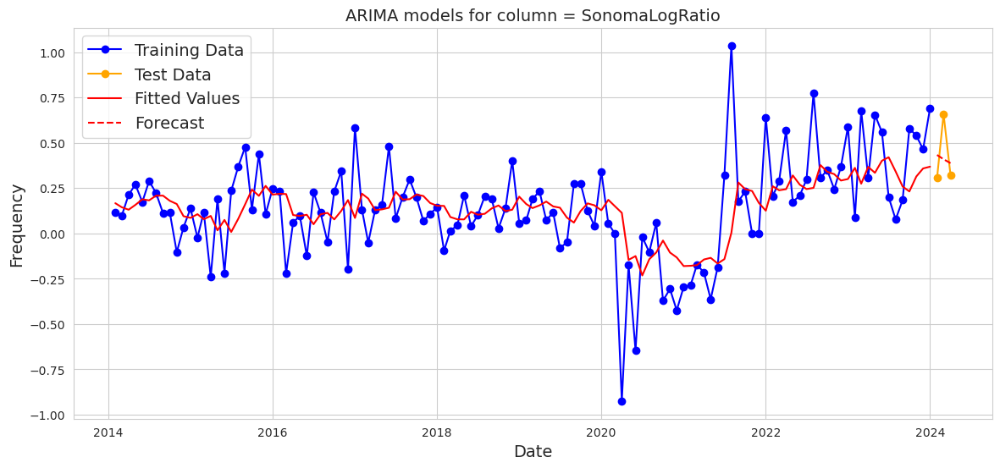

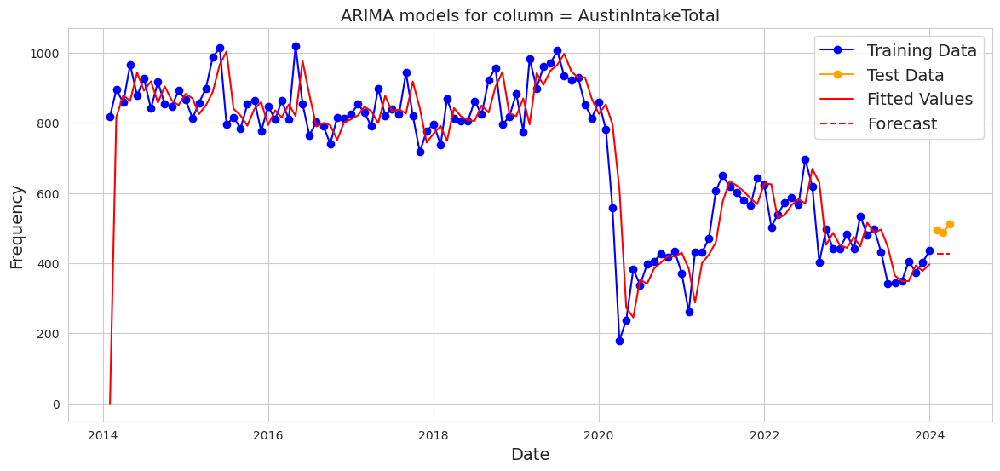

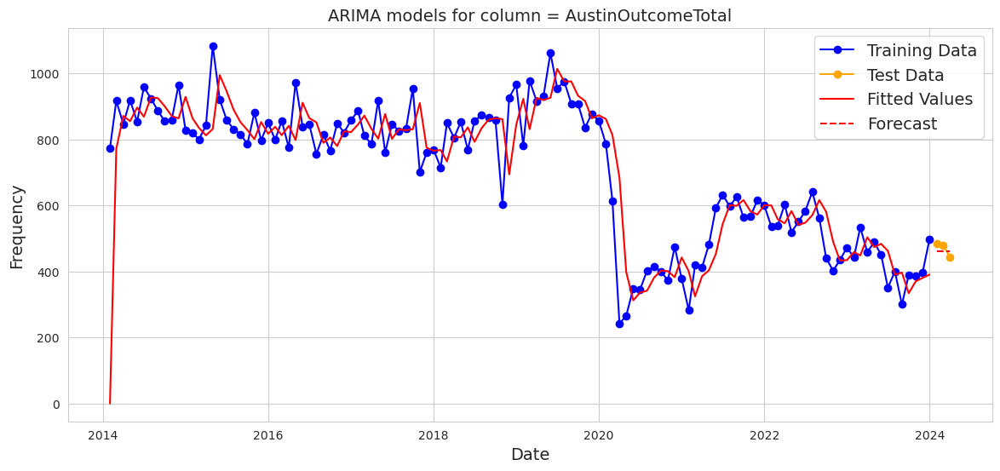

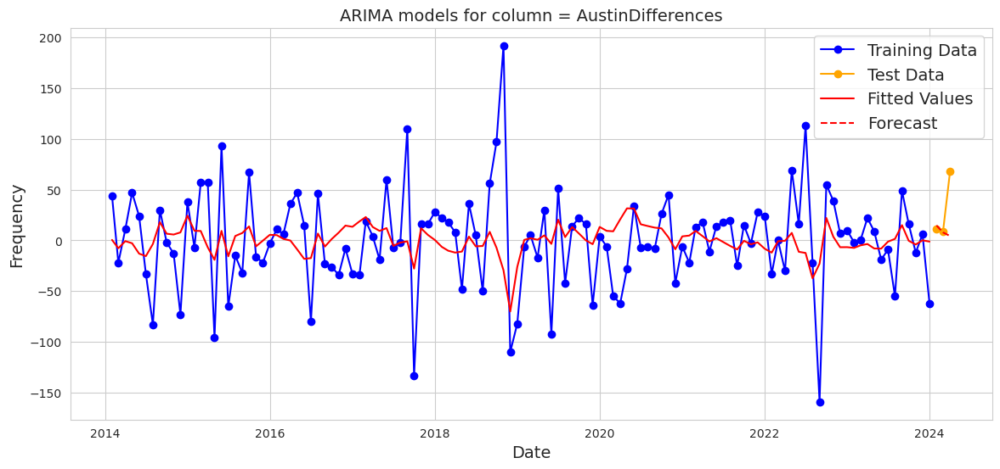

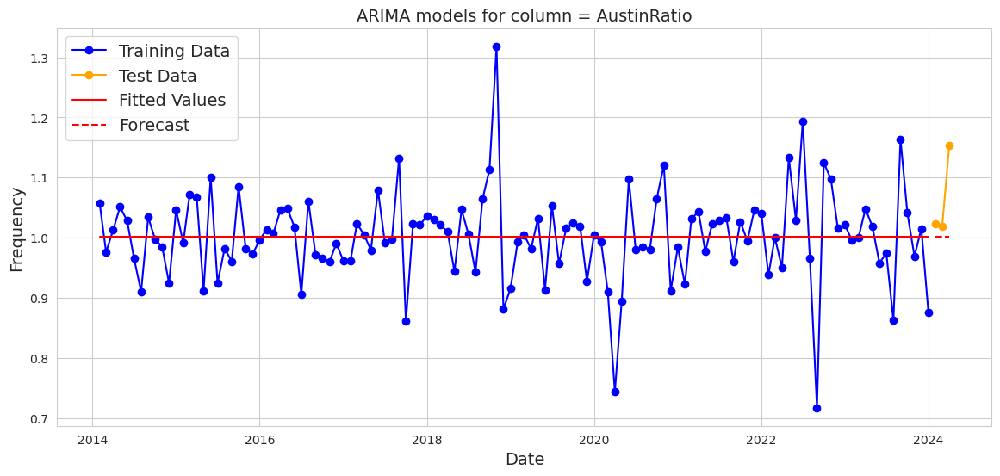

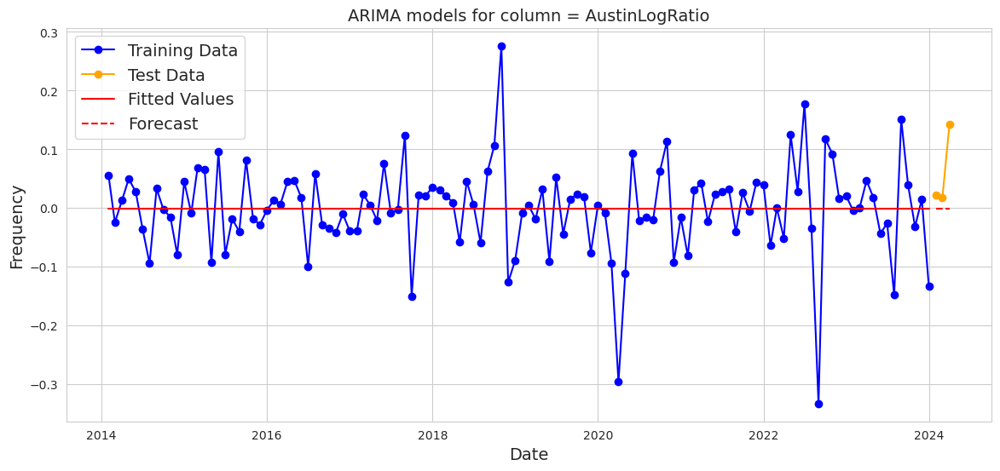

In [43]:
for i in range(len(col_list)):
    plt.figure(figsize=(14,6))

    plt.plot(df_train["Date"],
                df_train[col_list[i]],
                'b-o',
                label='Training Data')

    plt.plot(df_test["Date"],
                df_test[col_list[i]],
                color = 'orange',
                marker = 'o',
                label='Test Data')

    plt.plot(df_train["Date"],
                arima_models[i].fittedvalues,
                'r',
                label='Fitted Values')

    plt.plot(df_test["Date"],
                arima_models[i].forecast(len(df_test)),
                '--r',
                label="Forecast")

    plt.title("ARIMA models for column = " + col_list[i], fontsize=14)
    plt.legend(fontsize=14)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)

    plt.show()

In [44]:
# PACF plots
import statsmodels.api as sm

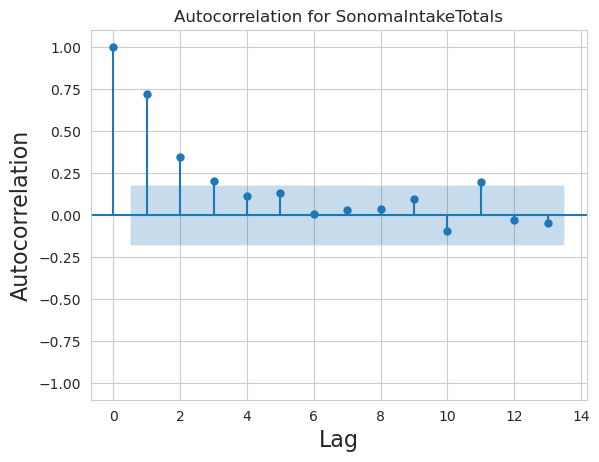

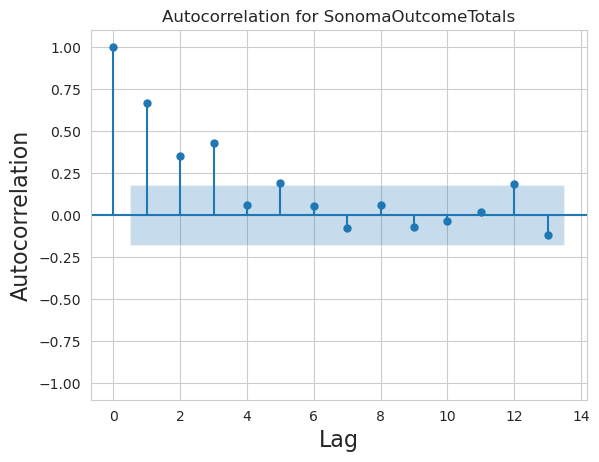

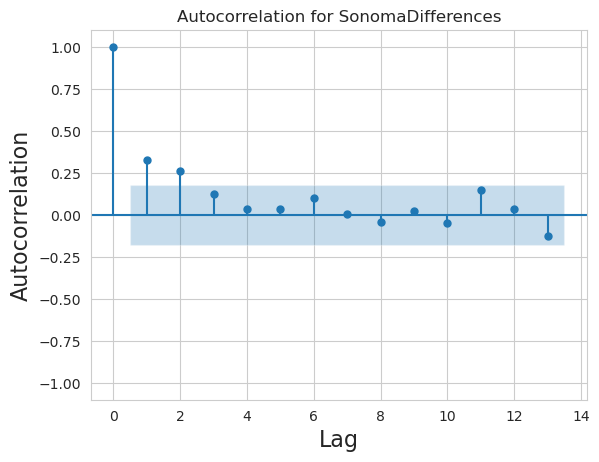

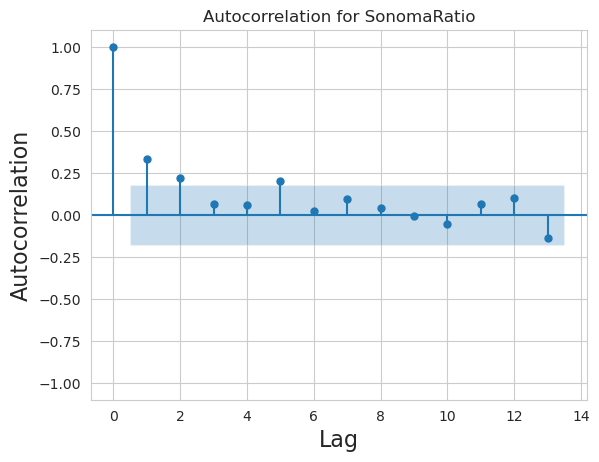

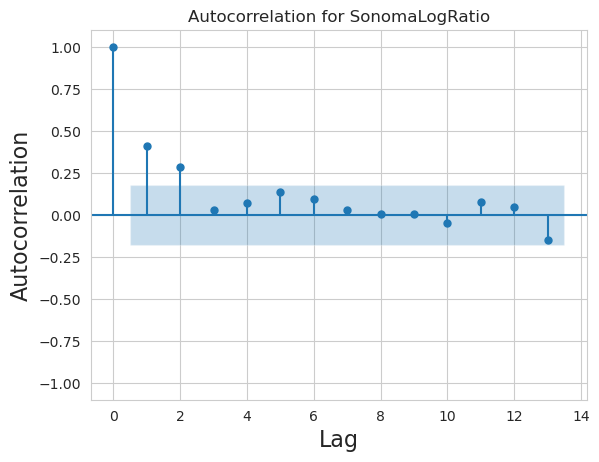

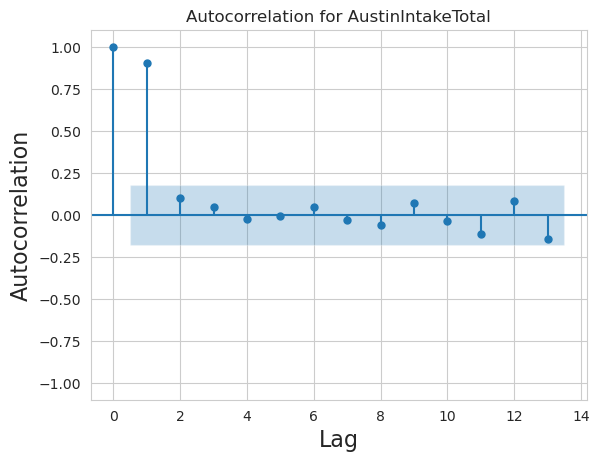

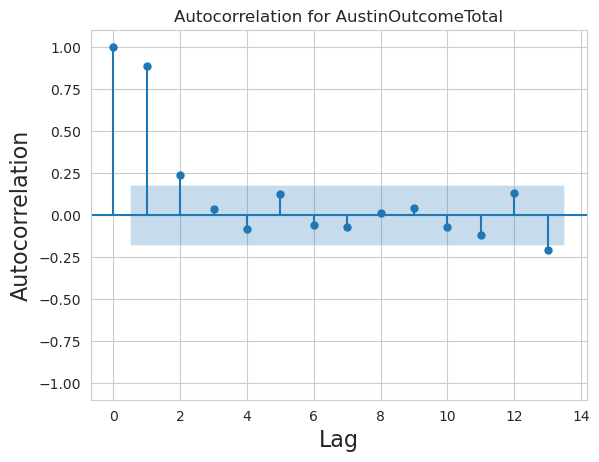

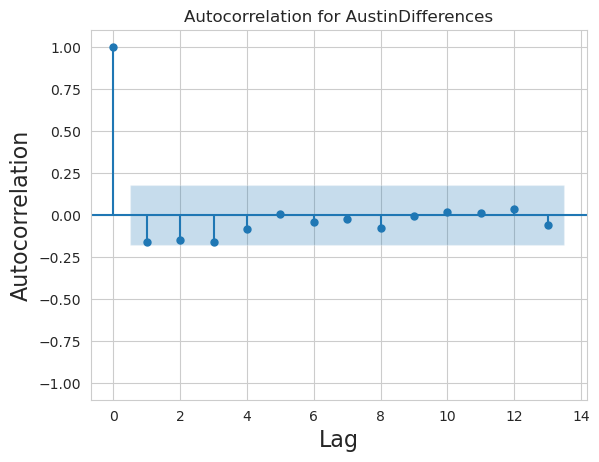

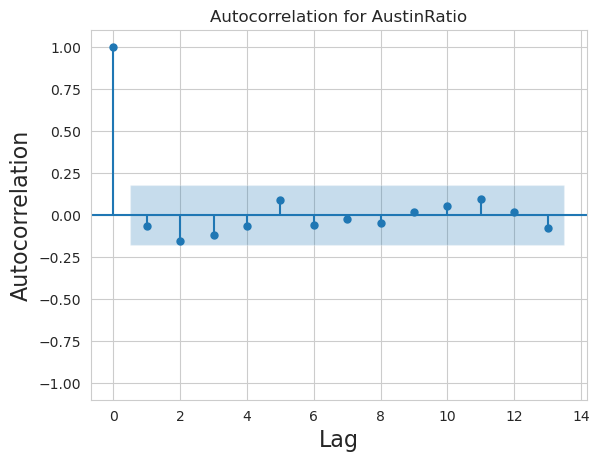

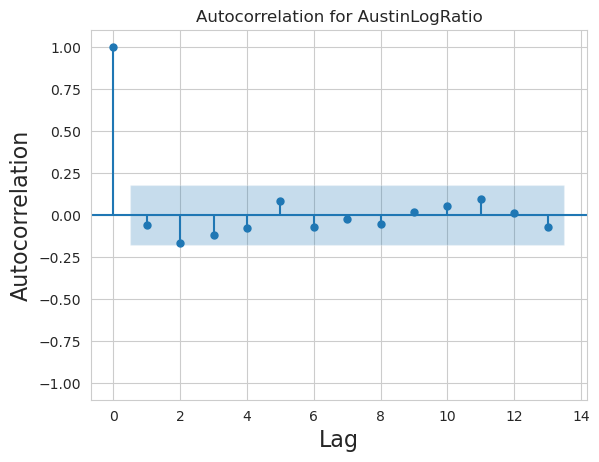

In [45]:
# Autocorrelation plots for starionarity and autocorrelation
for col in col_list:
    sm.graphics.tsa.plot_pacf(df_train[col],
                                lags = 13)

    plt.title('Autocorrelation for ' + col, fontsize=12)
    plt.ylabel("Autocorrelation", fontsize=16)
    plt.xlabel("Lag", fontsize=16)

    plt.ylim(-1.1,1.1)

    plt.show()

Nothing significant for SARIMA auto_arima test

## (3) Spicier stuff
- see [this paper on time series modelling with COVID-19](https://projecteuclid.org/journals/bayesian-analysis/advance-publication/Modeling-Extreme-Events-in-Time-Series-and-Their-Impact-on/10.1214/24-BA1424.full?tab=ArticleLink)